# **✨ Classification Models - Research Campaign Airbnb Seattle by The Golden Gate ✨**

**👏 Members of Golden Gate 👏**

1. Daniel Andrew
2. Habib Septrian Priyanto
3. Josua Ricardo Samosir
4. Muhammad Rizdky Maulady

## **📍 Table of Content 📍**

- Data Cleansing/Preprocessing
    - Merge Dataset
    - Handling Invalid Values
    - Handling Duplicated Data
    - Handling Missing Values
    - Handling Outliers
    - Feature Engineering / Extraction
    - Feature Transformation (Numeric)
    - Feature Encoding (Categoric)
    - Data Splitting
    - Feature Selection
    - Handling Imbalanced Data
    
- Modelling & Evaluation
    - Machine Learning Techniques
    - Modelling
        1. Decision Tree
        2. Random Forest
        3. Logistic Regression
        4. Gaussian Naive Bayes
        5. K-Nearest Neighbor
        6. MLP Classifier (Neural Network)
        7. Adaboost Classifier
        8. Gradient Boosting Classifier
        9. XGBoost Classifier
        10. LGBM Classifier
    - Model Evaluation
    - Model Comparison
    - Model Selection
    - Business Insight and Recomendation
    - Strategic Action
- Final Presentation

- **Dataset**

[Open Data Airbnb Seattle](https://www.kaggle.com/datasets/airbnb/seattle)

# **====== STAGE 2 ======**
`Stage 2 (Data PreProcessing)`

## **📌 Import Libraries**

In [ ]:
import gdown
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
from folium import plugins
from folium.plugins import HeatMap
from scipy.stats import pointbiserialr

# Ignores any warning
import warnings
warnings.filterwarnings("ignore")

import matplotlib as mp
%matplotlib inline
import textwrap
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap

## **📌 Import  Raw Datasets**

In [ ]:

# Import Dataset
dataset_link = 'https://drive.google.com/drive/folders/1wLAk6IsUNCWhGENAmAUnmXZxLiiv7m4q?usp=sharing'
gdown.download_folder(dataset_link, quiet=True, use_cookies=False)

# Path Dataset
path = '/content/Dataset/'

# Get the data from Dataset Folder
csv_files = [os.path.join(path, file) for file in os.listdir(path) if file.endswith('.csv')]
df = {}

# Load each CSV file into a DataFrame
for file_name in csv_files:
    base_name = os.path.basename(file_name).replace('.csv', '')
    print(f"Load Path: {file_name} into DataFrame: {base_name}..")

    # Load the file and store it
    df[base_name] = pd.read_csv(file_name)

print("\nList Dataset")
print(df.keys())

Load Path: /content/Dataset/calendar.csv into DataFrame: calendar..
Load Path: /content/Dataset/reviews.csv into DataFrame: reviews..
Load Path: /content/Dataset/listings.csv into DataFrame: listings..

List Dataset
dict_keys(['calendar', 'reviews', 'listings'])


In [ ]:
reviews = pd.read_csv('/content/Dataset/reviews.csv')
calendar = pd.read_csv('/content/Dataset/calendar.csv')
listings = pd.read_csv('/content/Dataset/listings.csv')

In [ ]:
print("Jumlah baris dan kolom:", reviews.shape)
df['reviews'].head()

Jumlah baris dan kolom: (84849, 6)


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,7202016,38917982,2015-07-19,28943674,Bianca,Cute and cozy place. Perfect location to every...
1,7202016,39087409,2015-07-20,32440555,Frank,Kelly has a great room in a very central locat...
2,7202016,39820030,2015-07-26,37722850,Ian,"Very spacious apartment, and in a great neighb..."
3,7202016,40813543,2015-08-02,33671805,George,Close to Seattle Center and all it has to offe...
4,7202016,41986501,2015-08-10,34959538,Ming,Kelly was a great host and very accommodating ...


In [ ]:
print("Jumlah baris dan kolom:", calendar.shape)
df['calendar'].head()

Jumlah baris dan kolom: (1393570, 4)


,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [ ]:
print("Jumlah baris dan kolom:", listings.shape)
df['listings'].head()

Jumlah baris dan kolom: (3818, 92)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [ ]:
df['listings'].columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

## **📌 Merge Datasets**

In [ ]:
# Agregasi data reviews untuk menghitung jumlah ulasan per listing
reviews_agg = reviews.groupby('listing_id').agg({
    'id': 'count'  # Menghitung total ulasan per listing
}).rename(columns={'id': 'number_of_reviews'}).reset_index()
reviews_agg.head()

,listing_id,number_of_reviews
0,4291,35
1,5682,297
2,6606,52
3,7369,40
4,9419,79


In [ ]:
# Jika listings memiliki kolom 'id' dan bukan 'listing_id', ganti di penggabungan
merged1 = pd.merge(listings, reviews_agg, left_on='id', right_on='listing_id', how='left')

merged1.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,number_of_reviews_y
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,NaN,WASHINGTON,f,moderate,f,f,2,4.07,241032.0,207.0
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,NaN,WASHINGTON,f,strict,t,t,6,1.48,953595.0,43.0
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,NaN,WASHINGTON,f,strict,f,f,2,1.15,3308979.0,20.0
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,WASHINGTON,f,flexible,f,f,1,NaN,NaN,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,NaN,WASHINGTON,f,strict,f,f,1,0.89,278830.0,38.0


In [ ]:
# Ambil harga terbaru dari calendar
calendar['date'] = pd.to_datetime(calendar['date'])
latest_calendar = calendar.loc[calendar.groupby('listing_id')['date'].idxmax()]
latest_calendar.head()

,listing_id,date,available,price
797524,3335,2017-01-02,t,$120.00
1138434,4291,2017-01-02,t,$82.00
790954,5682,2017-01-02,f,NaN
137969,6606,2017-01-02,t,$90.00
1006669,7369,2017-01-02,f,NaN


In [ ]:
# Mengkonversi type id 'listing_id' di latest_calendar seperti di merged_data
latest_calendar['listing_id'] = latest_calendar['listing_id'].astype(merged1['listing_id'].dtype)

# Merged data
df = pd.merge(merged1, latest_calendar[['listing_id', 'price', 'date']], on='listing_id', how='left')

df.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,number_of_reviews_y,price_y,date
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,f,moderate,f,f,2,4.07,241032.0,207.0,$85.00,2017-01-02
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,f,strict,t,t,6,1.48,953595.0,43.0,$400.00,2017-01-02
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,f,strict,f,f,2,1.15,3308979.0,20.0,$975.00,2017-01-02
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,f,flexible,f,f,1,NaN,NaN,NaN,NaN,NaT
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,f,strict,f,f,1,0.89,278830.0,38.0,$450.00,2017-01-02


In [ ]:
# Mengubah nama kolom
df = df.rename(columns={'price_x': 'price_listings'})
df = df.rename(columns={'price_y': 'price_calendar'})
df = df.rename(columns={'number_of_reviews_x': 'number_of_reviews'})

# Menghapus kolom double
df = df.drop(columns=['number_of_reviews_y'])

* Kolom price_x merupakan kolom price dari dataset listings yaitu harga sewa per malam (dalam dolar).
* Kolom price_y merupakan kolom price dari dataset calendar yaitu harga untuk tanggal tersebut (dalam dolar, bisa null untuk tanggal yang tidak tersedia).

In [ ]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

In [ ]:
#distribusi host_is_superhost
import plotly.express as px

host_superhost_counts = df['host_is_superhost'].value_counts()
host_superhost_percentage = (host_superhost_counts / host_superhost_counts.sum()) * 100

host_superhost_df = pd.DataFrame({
    'Host Superhost Status': host_superhost_counts.index,
    'Count': host_superhost_counts.values,
    'Percentage': host_superhost_percentage.values
})

fig = px.bar(
    host_superhost_df,
    x='Host Superhost Status',
    y='Count',
    color='Host Superhost Status', # Color the bars based on Superhost status
    text='Percentage',  # Display percentages on top of bars
    title='Distribution of Host Superhost Status',
    labels={'Count': 'Number of Hosts', 'Host Superhost Status': 'Host is Superhost', 'Percentage': 'Percentage of Hosts'}
)

fig.update_layout(title_x=0.5,  # Center the title
                  yaxis_title="Number of Hosts",
                  xaxis_title="Host is Superhost",
                  yaxis=dict(showgrid=True, gridcolor='lightgray'),
                  xaxis=dict(showgrid=False),
                  plot_bgcolor='white')

fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')

fig.show()

## **📌 Handling Invalid Values**

In [ ]:
# Mengatur opsi untuk menampilkan semua kolom
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom
display(df)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,$85.00,NaN,NaN,NaN,NaN,2,$5.00,1,365,4 weeks ago,t,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07,241032.0,$85.00,2017-01-02
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,t,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"7th Avenue West, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",NaN,$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,1,$0.00,2,90,today,t,13,13,16,291,2016-01-04,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48,953595.0,$400.00,2017-01-02


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 95 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                3818 non-null   int64         
 1   listing_url                       3818 non-null   object        
 2   scrape_id                         3818 non-null   int64         
 3   last_scraped                      3818 non-null   object        
 4   name                              3818 non-null   object        
 5   summary                           3641 non-null   object        
 6   space                             3249 non-null   object        
 7   description                       3818 non-null   object        
 8   experiences_offered               3818 non-null   object        
 9   neighborhood_overview             2786 non-null   object        
 10  notes                             2212 non-null 

### **1. Melakukan Penyesuaian Tipe Data Fitur `object` ke `datetime`**

In [ ]:
# Mengubah kolom tanggal menjadi datetime
date_columns = ['last_scraped', 'host_since', 'calendar_last_scraped',
                'first_review', 'last_review', 'date']

for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce')

Fitur yang diubah dari object ke datetime yaitu: last_scraped, host_since, calendar_last_scraped, first_review, last_review, dan date.

Karena, konversi ini memungkinkan analisis yang lebih efektif terhadap data berbasis waktu. Dengan tipe data datetime, kita dapat melakukan operasi seperti perhitungan durasi, pengelompokan data berdasarkan waktu, dan analisis tren temporal.

### **2. Melakukan Penyesuaian tipe data fitur `object` ke `float` beserta pengapusan simbol**

In [ ]:
# Mengubah kolom harga menjadi float
def convert_price(value):
    if pd.notnull(value):
        return float(value.replace('$', '').replace(',', ''))
    return value

columns_price = ['price_listings', 'weekly_price', 'monthly_price',
                 'security_deposit', 'cleaning_fee', 'extra_people', 'price_calendar']

for col in columns_price:
    df[col] = df[col].apply(convert_price)

Fitur yang diubah dari object ke float yaitu: price_listings, weekly_price, monthly_price, security_deposit, cleaning_fee, extra_people, dan price_calendar.

Karena konversi ini diperlukan untuk memastikan bahwa nilai-nilai yang berhubungan dengan harga dan biaya dapat digunakan dalam analisis numerik.

### **3. Melakukan Penyesuasian tipe data fitur `object` ke `bool`dari `t/f` menjadi `true / false`**

In [ ]:
# Mengubah nilai 't'/'f' menjadi True/False dan mengubah tipe data menjadi boolean
boolean_columns = ['host_is_superhost', 'host_has_profile_pic',
                   'host_identity_verified', 'is_location_exact',
                   'has_availability', 'instant_bookable',
                   'require_guest_profile_picture', 'require_guest_phone_verification']

for col in boolean_columns:
    df[col] = df[col].map({'t': True, 'f': False})
    df[col] = df[col].astype(bool)


Fitur yang diubah menjadi tipe data boolean yaitu: host_is_superhost, host_has_profile_pic, host_identity_verified, is_location_exact, has_availability, instant_bookable, require_guest_profile_picture, dan require_guest_phone_verification.

Karena konversi ini penting untuk memastikan bahwa kolom-kolom yang berisi informasi biner (ya/tidak) diwakili dengan tipe data yang sesuai.

### **4. Kolom `object` yang berisi angka perlu dikonversi ke `int` atau `float`**

In [ ]:
# Mengubah kolom menjadi int atau float
int_columns = ['accommodates', 'bathrooms', 'bedrooms', 'beds',
               'minimum_nights', 'maximum_nights', 'availability_30',
               'availability_60', 'availability_90', 'availability_365',
               'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy',
               'review_scores_cleanliness', 'review_scores_checkin',
               'review_scores_communication', 'review_scores_location',
               'review_scores_value', 'calculated_host_listings_count']

float_columns = ['bathrooms', 'bedrooms', 'beds',
                 'review_scores_rating', 'review_scores_accuracy',
                 'review_scores_cleanliness', 'review_scores_checkin',
                 'review_scores_communication', 'review_scores_location',
                 'review_scores_value', 'reviews_per_month']

for col in int_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce', downcast='integer')

for col in float_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce', downcast='float')


konversi ini diperlukan untuk memastikan bahwa kolom-kolom yang berisi data numerik diwakili dengan tipe data yang sesuai, sehingga memungkinkan analisis matematis dan statistik yang lebih akurat.

### **5. Kolom `boolean` yang tidak cocok perlu dikonversi ke `object` atau `float`**

In [ ]:
# Mengubah kolom boolean menjadi object atau float
boolean1_columns = ['notes','neighbourhood']
for col in boolean1_columns:
    df[col] = df[col].astype(object)

boolean2_columns = ['price_calendar','cleaning_fee']
for col in boolean2_columns:
    df[col] = df[col].astype(float)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 95 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                3818 non-null   int64         
 1   listing_url                       3818 non-null   object        
 2   scrape_id                         3818 non-null   int64         
 3   last_scraped                      3818 non-null   datetime64[ns]
 4   name                              3818 non-null   object        
 5   summary                           3641 non-null   object        
 6   space                             3249 non-null   object        
 7   description                       3818 non-null   object        
 8   experiences_offered               3818 non-null   object        
 9   neighborhood_overview             2786 non-null   object        
 10  notes                             2212 non-null 

In [ ]:
df.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,False,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",True,True,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,True,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,85.0,NaN,NaN,NaN,NaN,2,5.0,1,365,4 weeks ago,True,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,False,moderate,False,False,2,4.07,241032.0,85.0,2017-01-02
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,True,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",True,True,"7th Avenue West, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,True,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",NaN,150.0,1000.0,3000.0,100.0,40.0,1,0.0,2,90,today,True,13,13,16,291,2016-01-04,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,NaN,WASHINGTON,False,strict,True,True,6,1.48

In [ ]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

## **📌 Handle Duplicated Data**

In [ ]:
df[df.duplicated(keep=False)].sort_values(by=list(df.columns.values)).head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date


In [ ]:
#handle duplicated
df.duplicated().sum()

0

In [ ]:
print(f"Data Frame Dimension Before Duplicate Removal: {df.shape}")
df = df.drop_duplicates().reset_index(drop=True)
print(f"Data Frame Dimension After Duplicate Removal: {df.shape}")

Data Frame Dimension Before Duplicate Removal: (3818, 95)
Data Frame Dimension After Duplicate Removal: (3818, 95)


In [ ]:
# Memeriksa baris duplikat
duplicate_rows = df.duplicated()

# Menampilkan jumlah baris duplikat
print(f"Jumlah baris duplikat: {duplicate_rows.sum()}")

# Menampilkan baris duplikat
if duplicate_rows.sum() > 0:
    print("Baris duplikat:")
    print(df[duplicate_rows])
else:
    print("Tidak ada baris duplikat.")

Jumlah baris duplikat: 0
Tidak ada baris duplikat.


In [ ]:
df.duplicated(subset=["id"]).sum()

0

### **Kesimpulan**

Tidak ditemui baris data yang memiliki duplikat, sehingga tidak perlu melakukan handling duplicated data. Selain itu, pada pengecekan duplikat subset untuk ID tidak ditemukan ada nya ID yang sama.

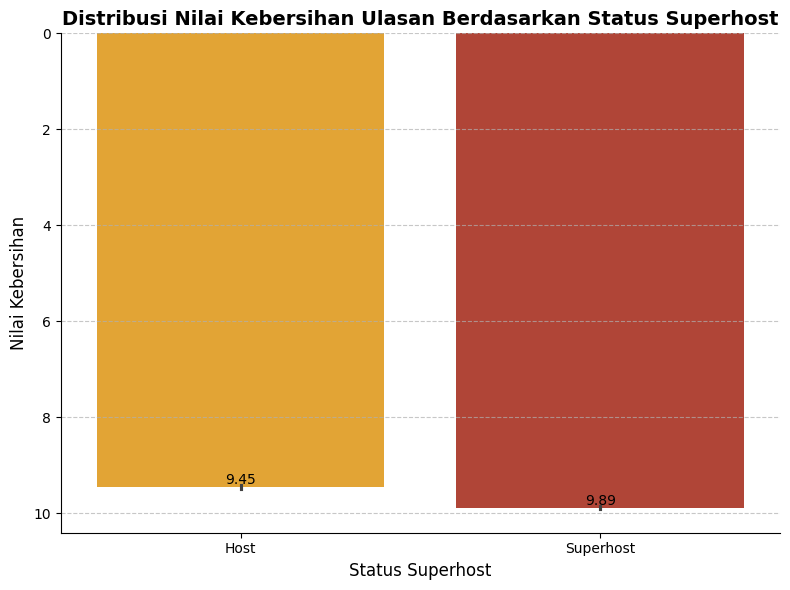

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='review_scores_cleanliness',
    data=df,
    palette=custom_palette
)

plt.title('Distribusi Nilai Kebersihan Ulasan Berdasarkan Status Superhost', fontsize=14, fontweight='bold')
plt.xlabel('Status Superhost', fontsize=12)
plt.ylabel('Nilai Kebersihan', fontsize=12)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=10)

plt.gca().invert_yaxis()

plt.grid(axis='y', linestyle='--', alpha=0.7)

sns.despine()

for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

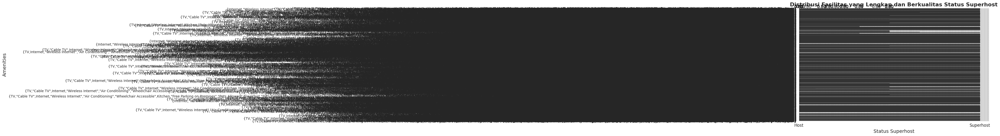

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    x='host_is_superhost',
    y='amenities',
    data=df,
    palette=["#ffac18", "#c43623"],
    ci=None,
    edgecolor=".2"
)

plt.title(
    'Distribusi Fasilitas yang Lengkap dan Berkualitas Status Superhost',
    fontsize=16,
    fontweight='bold'
)
plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Amenities', fontsize=14)
plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## **📌 Handle Missing Values**

---



In [ ]:
null_values = df.isnull().sum()
print(null_values)

id                                   0
listing_url                          0
scrape_id                            0
last_scraped                         0
name                                 0
                                  ... 
calculated_host_listings_count       0
reviews_per_month                  627
listing_id                         627
price_calendar                    1533
date                               627
Length: 95, dtype: int64


In [ ]:
# Menghitung total nilai null dan persentase
nvc = pd.DataFrame(null_values.sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = (nvc['Total Null Values'] / df.shape[0]) * 100
nvc["Data Type"] = [df[col].dtype for col in df.columns]
nvc.sort_values(by=["Total Null Values", "Percentage"], ascending=False, inplace=True)

# Menampilkan hasil
nvc.style.background_gradient(cmap='Blues')

,Total Null Values,Percentage,Data Type
license,3818,100.000000,datetime64[ns]
square_feet,3721,97.459403,float64
monthly_price,2301,60.267156,float64
security_deposit,1952,51.126244,float32
weekly_price,1809,47.380828,int8
notes,1606,42.063908,bool
price_calendar,1533,40.151912,bool
neighborhood_overview,1032,27.029859,object
cleaning_fee,1030,26.977475,bool
transit,934,24.463070,object


In [ ]:
for x in df.columns:
    unq = list(df[x].unique())
    try:
        # sorted_unq = sorted(unq) #jangan gunakan sorted
        sorted_unq = unq
    except TypeError:
        sorted_unq = unq
    print(f'===== {x} =====')
    if len(sorted_unq) >= 50:
        print(sorted_unq[:50] + ['.....'])
    else:
        print(sorted_unq)
    print()

===== id =====
[241032, 953595, 3308979, 7421966, 278830, 5956968, 1909058, 856550, 4948745, 2493658, 175576, 4454295, 3883392, 8889257, 5680462, 8988178, 3245876, 4933447, 7735464, 6291829, 9218403, 4125779, 8942678, 10106055, 6362362, 3544550, 9025039, 3200646, 8859380, 4520099, 2481869, 1110749, 5978498, 5021081, 1686930, 7680289, 7207641, 5062445, 8925878, 6389657, 4218733, 2715623, 1392332, 7308567, 6575380, 6004058, 9550869, 8515408, 5383192, 1112092, '.....']

===== listing_url =====
['https://www.airbnb.com/rooms/241032', 'https://www.airbnb.com/rooms/953595', 'https://www.airbnb.com/rooms/3308979', 'https://www.airbnb.com/rooms/7421966', 'https://www.airbnb.com/rooms/278830', 'https://www.airbnb.com/rooms/5956968', 'https://www.airbnb.com/rooms/1909058', 'https://www.airbnb.com/rooms/856550', 'https://www.airbnb.com/rooms/4948745', 'https://www.airbnb.com/rooms/2493658', 'https://www.airbnb.com/rooms/175576', 'https://www.airbnb.com/rooms/4454295', 'https://www.airbnb.com/room

### **Drop Column**

In [ ]:
# Menghapus kolom license dan square feet
df = df.drop(columns=['license', 'square_feet'])

# Menghapus kolom neighbourhood
df = df.drop(columns=['neighbourhood'])

* Kolom license dan square feet terlalu banyak baris yang kosong, membuat kolom tersebut tidak bisa digunakan
* Kolom neighbourhood tidak diperlukan karena sudah mempunyai versi cleansed nya

### **Drop Row**

In [ ]:
# Menghapus nilai null pada id
df = df.dropna(subset=['listing_id'])

Kolom id tidak boleh memiliki nilai kosong

### **Imputation Numeric**

In [ ]:
# Mencari Skewness pada fitur yang terdapat pada price_columns
price_columns = ['price_calendar', 'price_listings', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee']

skewness_results = []
for col in price_columns:
    skewness = df[col].skew()
    if skewness > 0.5:
        skew_description = "Right Skewed"
    elif skewness < -0.5:
        skew_description = "Left Skewed"
    else:
        skew_description = "Approximately Symmetrical"
    skewness_results.append([col, skewness, skew_description])

skewness_df = pd.DataFrame(skewness_results, columns=['Column', 'Skewness', 'Skewness Description'])
skewness_df

,Column,Skewness,Skewness Description
0,price_calendar,3.294078,Right Skewed
1,price_listings,3.351625,Right Skewed
2,weekly_price,3.100936,Right Skewed
3,monthly_price,3.219567,Right Skewed
4,security_deposit,6.645763,Right Skewed
5,cleaning_fee,1.836434,Right Skewed


In [ ]:
# Mengisi nilai kosong dengan nilai sebelumnya
rate_columns = ['last_review', 'first_review', 'host_response_rate', 'host_response_time']
for col in rate_columns:
    df[col] = df[col].ffill()

# Mengisi nilai kosong untuk kolom harga
price_columns = ['price_calendar']
for col in price_columns:
    df[col] = df[col].replace({'\$': '', ',': ''}, regex=True).astype(float)
    df[col] = df[col].fillna(df[col].median())

# Mengisi nilai kosong untuk monthly price
df['monthly_price'] = df.apply(
    lambda row: row['price_listings'] * 30 if pd.isna(row['monthly_price']) else row['monthly_price'],
    axis=1
)

# Mengisi nilai kosong untuk weekly price
df['weekly_price'] = df.apply(
    lambda row: row['price_listings'] * 7 if pd.isna(row['weekly_price']) else row['weekly_price'],
    axis=1
)

# Mengisi nilai kosong dengan 0
score_columns = ['reviews_per_month', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                  'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value',
                  'security_deposit', 'cleaning_fee']
for col in score_columns:
    df[col] = df[col].fillna(0)

Mengisi nilai null pada kolom numerik:
* fitur yang terdapat pada `rate_columns` nilai null Diisi dengan nilai sebelumnya
* fitur yang terdapat pada `price_columns` nilai null Diisi dengan nilai `median` karena memiliki right skewed dan nilai outlier ekstrem.
* fitur `monthly_price` nilai null Diisi dengan mengkalikan harga listing perhari dengan jumlah hari per bulan
* fitur `weekly_price` nilai null Diisi dengan mengkalikan harga listing perhari dengan jumlah hari per minggu
* fitur yang terdapat pada `score_columns` Diisi dengan nilai 0 karena tidak semua listing memiliki review dan fee tambahan

### **Imputation Categoric**

In [ ]:
# Mengisi nilai kosong dengan kata terbanyak
frequent_text = ['space', 'host_neighbourhood', 'bathrooms', 'host_location', 'bedrooms', 'host_since',
                 'host_total_listings_count', 'host_listings_count', 'host_name', 'property_type', 'beds', 'host_acceptance_rate']
for col in frequent_text:
    most_frequent_text = df[col].mode()[0]
    df[col] = df[col].fillna(most_frequent_text)

# Mengisi nilai kosong dengan tidak tersedia
not_available = df[['notes', 'neighborhood_overview', 'transit', 'host_about', 'summary', 'zipcode']] = df[['notes', 'neighborhood_overview', 'transit', 'host_about', 'summary', 'zipcode']].fillna('not available')

# Mengisi nilai kosong gambar dengan no image
no_image = df[['thumbnail_url', 'medium_url', 'xl_picture_url', 'host_picture_url', 'host_has_profile_pic', 'host_thumbnail_url']] = df[['thumbnail_url', 'medium_url', 'xl_picture_url', 'host_picture_url', 'host_has_profile_pic', 'host_thumbnail_url']].fillna("No Image")

Mengisi nilai null pada kolom kategorik:
* fitur yang terdapat pada `frequent_text` Diisi dengan kata yang paling banyak muncul atau modus
* fitur yang terdapat pada `not_available` Diisi dengan kata tidak tersedia
* fitur yang terdapat pada `no_image` Diisi dengan kata no image untuk kolom yang memiliki gambar

In [ ]:
# Menghitung jumlah nilai null di setiap kolom setelah preprocessing
null_values_after = df.isnull().sum()

# Membuat DataFrame untuk menampilkan hasil
nvc = pd.DataFrame(null_values_after.sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = (nvc['Total Null Values'] / df.shape[0]) * 100
nvc["Data Type"] = [df[col].dtype for col in df.columns]
nvc.sort_values(by=["Total Null Values", "Percentage"], ascending=False, inplace=True)

# Menampilkan hasil
nvc.style.background_gradient(cmap='Blues')

,Total Null Values,Percentage,Data Type
id,0,0.000000,int64
availability_30,0,0.000000,object
has_availability,0,0.000000,int64
calendar_updated,0,0.000000,datetime64[ns]
maximum_nights,0,0.000000,object
minimum_nights,0,0.000000,object
extra_people,0,0.000000,object
guests_included,0,0.000000,object
cleaning_fee,0,0.000000,object
security_deposit,0,0.000000,object


### **Kesimpulan**
Proses penanganan nilai hilang dalam dataset ini melibatkan beberapa langkah yang sistematis:

1. Penghapusan Fitur: Fitur-fitur seperti 'license', 'square_feet', dan 'neighbourhood' dihapus karena tingginya jumlah nilai hilang atau karena redundansi, di mana fitur 'neighbourhood' telah digantikan oleh fitur lain.
2. Penghapusan Baris: Baris yang memiliki nilai hilang pada fitur 'listing_id' dihapus, mengingat pentingnya pengidentifikasi ini dalam analisis.

3. Imputasi (Numerik):

* Fitur yang merepresentasikan tingkat (last_review, first_review, host_response_rate, host_response_time) diimputasi menggunakan metode forward fill untuk menjaga konsistensi temporal.
* Fitur terkait harga dibersihkan dengan menghapus simbol mata uang dan diimputasi menggunakan nilai median, mengingat adanya skewness ke kanan dan outlier ekstrem.
* Fitur terkait harga perbulan dan perminggu diisi dengan perkalian harga perharinya.
* Fitur review score diisi dengan 0 agar setiap listing mendapatkan score yang fair dan fitur fee tambahan diisi dengan 0 karena tidak semua listing punya fasilitas tambahan.
4. Imputasi (Kategorikal):
* Fitur yang berisi data teks diimputasi dengan kategori yang paling sering muncul (modus).
* Fitur tertentu seperti 'host_name' dan 'host_identity_verified' diisi dengan nilai 'not available'.
* Fitur yang berkaitan dengan gambar diisi dengan "No Image.

Setelah melakukan langkah-langkah tersebut, tidak ada nilai hilang yang tersisa dalam dataset. Pemilihan metode imputasi (mean, median, modus, forward fill, atau konstanta) didasarkan pada tipe data dan distribusi fitur yang bersangkutan.

## **📌 Handling Outliers**

### **Checking Outlier**

In [ ]:
import plotly.graph_objects as go

#Visualisasi Outlier untuk semua fitur dengan membedakan total superhost dengan not superhost
def plot_outliers(df, col):
  fig = go.Figure()

  # Plot all data
  fig.add_trace(go.Box(y=df[col], name='All Data', marker_color='lightblue'))

  # Plot superhost data
  superhost_df = df[df['host_is_superhost'] == True]
  fig.add_trace(go.Box(y=superhost_df[col], name='Superhost', marker_color='green'))

  # Plot non-superhost data
  not_superhost_df = df[df['host_is_superhost'] == False]
  fig.add_trace(go.Box(y=not_superhost_df[col], name='Not Superhost', marker_color='red'))


  fig.update_layout(
      title=f'Outlier Detection for {col}',
      title_x=0.5,
      yaxis_title=col,
      xaxis_title="Host Type",
      plot_bgcolor='white',
  )
  fig.show()

#
num_cols = df.select_dtypes(include=np.number).columns.tolist()

for col in num_cols:
  plot_outliers(df, col)

In [ ]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()  # Or define your num_cols manually

print(f'Jumlah baris: {len(df)}')
outlier = []
no_outlier = []
is_outlier = []
low_lim = []
high_lim = []
filtered_entries = np.array([True] * len(df))

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)
    filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit))
    outlier.append(len(df[~filter_outlier]))
    no_outlier.append(len(df[filter_outlier]))
    is_outlier.append(df[col][~filter_outlier].any())
    low_lim.append(low_limit)
    high_lim.append(high_limit)
    filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries

print("Outlier All Data :", len(df[~filtered_entries]))
print("Not Outlier All Data :", len(df[filtered_entries]))
print()

outlier_summary = pd.DataFrame({
    "Column Name": num_cols,
    "is Outlier": is_outlier,
    "Lower Limit": low_lim,
    "Upper Limit": high_lim,
    "Outlier": outlier,
    "No Outlier": no_outlier
})

outlier_summary

Jumlah baris: 3191
Outlier All Data : 2058
Not Outlier All Data : 1133



,Column Name,is Outlier,Lower Limit,Upper Limit,Outlier,No Outlier
0,id,False,-4.418180e+06,1.459816e+07,0,3191
1,scrape_id,False,2.016010e+13,2.016010e+13,0,3191
2,host_id,False,-2.756480e+07,5.413978e+07,0,3191
3,host_listings_count,True,-2.000000e+00,6.000000e+00,396,2795
4,host_total_listings_count,True,-2.000000e+00,6.000000e+00,396,2795
5,latitude,True,4.752846e+01,4.774261e+01,56,3135
6,longitude,False,-1.224186e+02,-1.222460e+02,0,3191
7,accommodates,True,-1.000000e+00,7.000000e+00,158,3033
8,bathrooms,True,1.000000e+00,1.000000e+00,750,2441
9,bedrooms,True,-5.000000e-01,3.500000e+00,77,3114


In [ ]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns

# Create an empty dictionary to store distribution descriptions
distribution_descriptions = {}

# Iterate through numerical columns
for col in numerical_cols:
    # Calculate skewness
    skewness = df[col].skew()

    # Categorize distribution based on skewness
    if abs(skewness) < 0.5:
        distribution = "Approximately Normal"
    elif skewness > 0.5:
        distribution = "Right Skewed"
    else:
        distribution = "Left Skewed"

    # Store the description
    distribution_descriptions[col] = distribution

# Create a DataFrame from the distribution descriptions
distribution_df = pd.DataFrame(list(distribution_descriptions.items()), columns=['Feature', 'Distribution'])

# Display the DataFrame
distribution_df

,Feature,Distribution
0,id,Approximately Normal
1,scrape_id,Approximately Normal
2,host_id,Right Skewed
3,host_listings_count,Right Skewed
4,host_total_listings_count,Right Skewed
5,latitude,Approximately Normal
6,longitude,Approximately Normal
7,accommodates,Right Skewed
8,bathrooms,Right Skewed
9,bedrooms,Right Skewed


### **Cara Handle Outlier**

### **IQR (Interquartile Range)**

In [ ]:
# Define a function to handle outliers using IQR
# def handle_outliers_iqr(df, col):
    # # Calculate Q1, Q3, and IQR
    # Q1 = df[col].quantile(0.25)
    # Q3 = df[col].quantile(0.75)
    # IQR = Q3 - Q1

    ## Calculate lower and upper limits
    # lower_limit = Q1 - 1.5 * IQR
    # upper_limit = Q3 + 1.5 * IQR

    ## Replace outliers with the limits
    # df[col] = np.where(df[col] < lower_limit, lower_limit, df[col]) # Replace outliers below lower limit
    # df[col] = np.where(df[col] > upper_limit, upper_limit, df[col]) # Replace outliers above upper limit

    # return df

## Apply IQR outlier handling to specified numerical columns
# num_cols = df.select_dtypes(include=np.number).columns.tolist() # Get numerical column names

# for col in num_cols:
    # df = handle_outliers_iqr(df, col) # Apply IQR handling to each numerical column

## Recalculate outlier statistics after handling
# outlier = []
# no_outlier = []
# is_outlier = []
# low_lim = []
# high_lim = []
# filtered_entries = np.array([True] * len(df)) # Initialize a boolean array for filtering

# for col in num_cols:
    # Q1 = df[col].quantile(0.25) # Calculate Q1
    # Q3 = df[col].quantile(0.75) # Calculate Q3
    # IQR = Q3 - Q1 # Calculate IQR
    # low_limit = Q1 - (IQR * 1.5) # Calculate lower limit
    # high_limit = Q3 + (IQR * 1.5) # Calculate upper limit
    # filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit)) # Create a boolean filter for outliers
    # outlier.append(len(df[~filter_outlier])) # Count outliers
    # no_outlier.append(len(df[filter_outlier]))  # Count non-outliers
    # is_outlier.append(df[col][~filter_outlier].any()) # Check if any outliers exist
    # low_lim.append(low_limit)  # Store lower limit
    # high_lim.append(high_limit)  # Store upper limit
    # filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries # Update filter for all columns

# print("Outlier All Data :", len(df[~filtered_entries])) # Total outliers across all columns
# print("Not Outlier All Data :", len(df[filtered_entries])) # Total non-outliers across all columns
# print()

# outlier_summary = pd.DataFrame({
    # "Column Name": num_cols,
    # "is Outlier": is_outlier,
    # "Lower Limit": low_lim,
    # "Upper Limit": high_lim,
    # "Outlier": outlier,
    # "No Outlier": no_outlier
# })

# Display the outlier summary
# outlier_summary

* Tidak ada outlier pada dataset ini untuk semua kolom. Semua data dianggap berada dalam batas yang wajar sesuai dengan perhitungan IQR

* Meskipun nilai outlier teratasi semua, Perhitungan IQR tidak cocok untuk mendeteksi outlier dalam dataset dengan distribusi tertentu, terutama jika distribusi tidak normal atau data cenderung homogen.

Maka pada dataset yang kita miliki tidak terlalu cocok karna banyak memiliki nilai ekstrem.

### **Z-Score**
Z-Score digunakan untuk kolom yang mendekati distribusi normal.

In [ ]:
# Z-Score outlier handling
# from scipy import stats

# def handle_outliers_zscore(df, col, threshold=3):
    # z = np.abs(stats.zscore(df[col]))
    # df[col] = np.where(z > threshold, np.nan, df[col])
    # return df

# num_cols = df.select_dtypes(include=np.number).columns.tolist()
# for col in num_cols:
    # df = handle_outliers_zscore(df, col)

# Impute missing values after Z-score outlier removal (replace NaN with median)
# for col in num_cols:
    # df[col] = df[col].fillna(df[col].median())

# Recalculate outlier statistics after Z-score handling
# outlier = []
# no_outlier = []
# is_outlier = []
# low_lim = []
# high_lim = []
# filtered_entries = np.array([True] * len(df))

# for col in num_cols:
    # Q1 = df[col].quantile(0.25)
    # Q3 = df[col].quantile(0.75)
    # IQR = Q3 - Q1
    # low_limit = Q1 - (IQR * 1.5)
    # high_limit = Q3 + (IQR * 1.5)
    # filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit))
    # outlier.append(len(df[~filter_outlier]))
    # no_outlier.append(len(df[filter_outlier]))
    # is_outlier.append(df[col][~filter_outlier].any())
    # low_lim.append(low_limit)
    # high_lim.append(high_limit)
    # filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries

# print("Outlier All Data :", len(df[~filtered_entries]))
# print("Not Outlier All Data :", len(df[filtered_entries]))
# print()

# outlier_summary = pd.DataFrame({
    # "Column Name": num_cols,
    # "is Outlier": is_outlier,
    # "Lower Limit": low_lim,
    # "Upper Limit": high_lim,
    # "Outlier": outlier,
    # "No Outlier": no_outlier
# })

# outlier_summary

* Sebelum handling dengan Z-Score, jumlah total baris adalah 3191.
* Setelah Z-Score, terdapat 2841 outliers dan hanya 350 non-outliers yang tersisa.

* Z-Score terlalu ketat untuk dataset dengan distribusi skewed, sehingga menganggap banyak data valid sebagai outlier.


Hasil Z-Score kurang optimal untuk dataset ini karena terlalu banyak data yang dianggap outlier (89%)


### **Winsorization**

Winsorization mengganti nilai outlier dengan nilai batas tertentu, misalnya persentil 1% (batas bawah) dan 99% (batas atas). Ini cocok untuk data yang benar-benar memiliki outlier ekstrem.

In [ ]:
from scipy.stats.mstats import winsorize

# Select numerical columns for winsorization
num_cols = df.select_dtypes(include=np.number).columns

# Apply winsorization to specified numerical columns
for col in num_cols:
    df[col] = winsorize(df[col], limits=[0.01, 0.01])  # Winsorize at 1st and 99th percentiles

# Recalculate outlier statistics after winsorization
outlier = []
no_outlier = []
is_outlier = []
low_lim = []
high_lim = []
filtered_entries = np.array([True] * len(df))

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)
    filter_outlier = ((df[col] >= low_limit) & (df[col] <= high_limit))
    outlier.append(len(df[~filter_outlier]))
    no_outlier.append(len(df[filter_outlier]))
    is_outlier.append(df[col][~filter_outlier].any())
    low_lim.append(low_limit)
    high_lim.append(high_limit)
    filtered_entries = ((df[col] >= low_limit) & (df[col] <= high_limit)) & filtered_entries

print("Outlier All Data :", len(df[~filtered_entries]))
print("Not Outlier All Data :", len(df[filtered_entries]))
print()

outlier_summary = pd.DataFrame({
    "Column Name": num_cols,
    "is Outlier": is_outlier,
    "Lower Limit": low_lim,
    "Upper Limit": high_lim,
    "Outlier": outlier,
    "No Outlier": no_outlier
})

# Display the outlier summary after winsorization
outlier_summary

Outlier All Data : 2051
Not Outlier All Data : 1140



,Column Name,is Outlier,Lower Limit,Upper Limit,Outlier,No Outlier
0,id,False,-4.418180e+06,1.459816e+07,0,3191
1,scrape_id,False,2.016010e+13,2.016010e+13,0,3191
2,host_id,False,-2.756480e+07,5.413978e+07,0,3191
3,host_listings_count,True,-2.000000e+00,6.000000e+00,396,2795
4,host_total_listings_count,True,-2.000000e+00,6.000000e+00,396,2795
5,latitude,True,4.752846e+01,4.774261e+01,56,3135
6,longitude,False,-1.224186e+02,-1.222460e+02,0,3191
7,accommodates,True,-1.000000e+00,7.000000e+00,158,3033
8,bathrooms,True,1.000000e+00,1.000000e+00,725,2466
9,bedrooms,True,-5.000000e-01,3.500000e+00,77,3114


* Outlier All Data: 2755 outlier, dengan 436 data yang tidak terdeteksi sebagai outlier.
* Menjaga Data: Winsorization menggantikan nilai ekstrim dengan batas atas atau bawah yang telah ditentukan, bukan menghapusnya, sehingga data tetap utuh dan tidak hilang.

Winsorization dapat diteruskan jika Anda ingin menjaga sebanyak mungkin data sambil mengurangi dampak dari nilai ekstrim.

### **Kesimpulan**

* `IQR`, Meskipun nilai outlier teratasi semua, Perhitungan IQR tidak cocok untuk mendeteksi outlier dalam dataset dengan distribusi tertentu, terutama jika distribusi tidak normal atau data cenderung homogen.
* `Winsorization` dapat diteruskan jika Anda ingin menjaga sebanyak mungkin data sambil mengurangi dampak dari nilai ekstrim.
* `Z-Score` lebih cocok jika data terdistribusi normal.

1. `Pilihan Pertama`, Karena Data kita memiliki banyak nilai ekstrem dan tidak terdistribusi normal: Winsorization adalah pilihan yang baik karena menggantikan outlier dengan batas yang lebih realistis tanpa menghapus data, namun tetap dapat mempertahankan informasi penting dalam data.

Namun `jika hasilnya model akhir kurang memuaskan` bisa memilih opsi kedua

2. `Pilihan Kedua`, mencari kembali metode yang baik selain `winsorization`

## **📌 Feature Engineering / Extraction**

## **Menambah Kolom / Fitur**

In [ ]:
# Memisahkan kolom date menjadi day, month, dan year
df['day'] = df.date.dt.day
df['month'] = df.date.dt.month
df['year'] = df.date.dt.year

### **1. Membuat Kolom `day, month, and year`**

Memisahkan kolom date menjadi hari, tanggal, dan tahun untuk mendapatkan insight yang lebih rinci

In [ ]:
review_score_columns = [
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value'
]
df['average_review_score'] = df[review_score_columns].mean(axis=1)

### **2. Membuat Kolom `average review score`**

Rata-rata dari semua skor ulasan

In [ ]:
df['property_attractiveness'] = (df['average_review_score'] * df['number_of_reviews'])

### **3. Membuat Kolom `property attractiveness`**

Mengukur seberapa menarik properti berdasarkan ulasan dan skor rata-rata

In [ ]:
df['review_positive_ratio'] = (df['review_scores_rating'] / 100) * df['number_of_reviews']

### **4. Membuat Kolom `review positive ratio`**

Mengukur kualitas ulasan berdasarkan skor ulasan keseluruhan

In [ ]:
df['booking_frequency'] = 1 - (df['availability_365'] / 365)

### **5. Membuat Kolom `booking frequency`**

Mengukur apakah properti sering dipesan atau tersedia untuk waktu yang lama

In [ ]:
df['high_quality_listings_ratio'] = (
    (df['review_scores_rating'] >= 90).astype(int) / df['number_of_reviews']
).fillna(0)

### **6. Membuat Kolom `high quality listings`**

Mengukur seberapa sering listing mendapatkan skor ulasan tinggi

In [ ]:
df['response_speed'] = df['number_of_reviews'] / df['reviews_per_month']

### **7. Membuat Kolom `response speed`**

Mengukur seberapa sering listing mendapatkan review tiap bulannya

In [ ]:
display(df)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date,day,month,year,average_review_score,property_attractiveness,review_positive_ratio,booking_frequency,high_quality_listings_ratio,response_speed
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,not available,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,not available,not available,not available,No Image,No Image,https://a1.muscache.com/ac/pictures/67560560/c...,No Image,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,False,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",True,True,"Gilman Dr W, Seattle, WA 98119, United States",West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,True,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",85.0,595.0,2550.0,0.0,0.0,2,5.0,1,365,4 weeks ago,True,14,41,71,346,2016-01-04,191,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,WASHINGTON,False,moderate,False,False,2,4.07,241032.0,85.0,2017-01-02,2,1,2017,22.000000,4202.000000,181.449997,0.052055,0.005236,46.928745
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,True,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",True,True,"7th Avenue West, Seattle, WA 98119, United States",West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,True,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet

## **📌 Feature Transformation (Numeric)**

In [ ]:
numerical_cols = df.select_dtypes(include=np.number).columns

# Create an empty dictionary to store skewness and transformation suggestions
transformation_suggestions = {}

# Iterate through numerical columns
for col in numerical_cols:
    skewness = df[col].skew()

    if abs(skewness) < 0.5:
        transformation = "(Approximately Normal)"
    elif skewness > 0.5:
        transformation = "(Right Skewed)"
    else:  # skewness < -0.5
        transformation = "(Left Skewed)"

    transformation_suggestions[col] = {
        'skewness': skewness,
        'transformation': transformation
    }

# Create a DataFrame from the transformation suggestions
transformation_df = pd.DataFrame.from_dict(transformation_suggestions, orient='index')
transformation_df = transformation_df.reset_index().rename(columns={'index': 'Feature'})

# Display the DataFrame
transformation_df

,Feature,skewness,transformation
0,id,-0.222035,(Approximately Normal)
1,scrape_id,0.000000,(Approximately Normal)
2,host_id,0.854274,(Right Skewed)
3,host_listings_count,6.399592,(Right Skewed)
4,host_total_listings_count,6.399592,(Right Skewed)
5,latitude,-0.233460,(Approximately Normal)
6,longitude,-0.197722,(Approximately Normal)
7,accommodates,1.290080,(Right Skewed)
8,bathrooms,2.355341,(Right Skewed)
9,bedrooms,1.176374,(Right Skewed)


In [ ]:
from scipy.stats import skew, kurtosis
import pandas as pd

num_cols = df.select_dtypes(include=np.number).columns.tolist()

skew_type_list = []
skew_val_list = []
kurtosis_val_list = []

for column in num_cols:
    data = df[column].dropna(axis=0)
    mean = round(data.mean(), 3)
    median = data.median()
    mode = data.mode()[0]
    skew_val = round(skew(data, nan_policy="omit"), 3)
    kurtosis_val = round(kurtosis(data, nan_policy="omit"), 3)

    if (mean == median == mode) or (-0.2 < skew_val < 0.2):
        skew_type = "Normal Distribution (Symmetric)"
    elif mean < median < mode:
        skew_type = "Negatively Skewed"
        if skew_val <= -1:
            skew_type = "Highly Negatively Skewed"
        elif -0.5 >= skew_val > -1:
            skew_type = "Moderately Negatively Skewed"
        else:
            skew_type = "Moderately Normal Distribution (Symmetric)"
    else:
        skew_type = "Positively Skewed"
        if skew_val >= 1:
            skew_type = "Highly Positively Skewed"
        elif 0.5 <= skew_val < 1:
            skew_type = "Moderately Positively Skewed"
        else:
            skew_type = "Moderately Normal Distribution (Symmetric)"

    skew_type_list.append(skew_type)
    skew_val_list.append(skew_val)
    kurtosis_val_list.append(kurtosis_val)

dist = pd.DataFrame({
    "Column Name": num_cols,
    "Skewness": skew_val_list,
    "Kurtosis": kurtosis_val_list,
    "Type of Distribution": skew_type_list
})

# Specific adjustments for certain columns (if needed)
dist.loc[dist["Column Name"].isin(["Z_CostContact", "Z_Revenue"]), "Type of Distribution"] = "Uniform Distribution"
dist.loc[dist["Column Name"].isin(["Kidhome", "Teenhome"]), "Type of Distribution"] = "Bimodal Distribution"

dist = dist.sort_values(["Type of Distribution", "Column Name"]).reset_index(drop=True)
dist

,Column Name,Skewness,Kurtosis,Type of Distribution
0,average_review_score,-3.110,13.807,Highly Negatively Skewed
1,review_scores_rating,-2.440,7.867,Highly Negatively Skewed
2,accommodates,1.289,1.426,Highly Positively Skewed
3,bathrooms,2.354,5.139,Highly Positively Skewed
4,bedrooms,1.176,1.631,Highly Positively Skewed
5,beds,1.743,3.027,Highly Positively Skewed
6,calculated_host_listings_count,4.364,19.020,Highly Positively Skewed
7,cleaning_fee,1.620,3.286,Highly Positively Skewed
8,extra_people,1.750,3.703,Highly Positively Skewed
9,guests_included,2.168,5.100,Highly Positively Skewed


Dari hasil temuan tersebut, kita dapat menentukan beberapa transformasi yang akan dilakukan berdasarkan tipe distribusi setiap kolom. Berikut adalah langkah-langkah transformasi yang bisa diambil:

 **`1. Scaling and Converting to a Normal Distribution`**


Kolom dengan skewness tinggi (baik positif maupun negatif) memerlukan transformasi untuk mendekati distribusi normal. Transformasi yang umum digunakan adalah:

* Log Transformation: Untuk kolom yang sangat positif skewed.
* Box-Cox Transformation: Memerlukan data positif dan dapat mengubah data menjadi distribusi normal.
* Yeo-Johnson Transformation: Alternatif * Box-Cox untuk data yang bisa memiliki nilai nol atau negatif.

Daftar kolom yang dapat ditransformasi:

- average_review_score
- review_scores_rating
- accommodates
- bathrooms
- bedrooms
- beds
- calculated_host_listings_count
- cleaning_fee
- extra_people
- guests_included
- high_quality_listings_ratio
- host_listings_count
- host_total_listings_count
- minimum_nights
- monthly_price
- number_of_reviews
- price_calendar
- price_listings
- property_attractiveness
- response_speed
- review_positive_ratio
- reviews_per_month
- security_deposit
- weekly_price
- availability_365
- availability_60
- availability_90
- maximum_nights
- review_scores_accuracy
- review_scores_checkin
- review_scores_cleanliness
- review_scores_communication
- review_scores_location
- review_scores_value

**`2. Just Scaling`**

Kolom dengan distribusi yang relatif normal atau sedikit skewed mungkin hanya memerlukan skala ulang, seperti:

Normalization: Mengubah nilai ke dalam rentang [0, 1].
Standardization: Mengubah nilai ke bentuk distribusi standar dengan mean 0 dan standar deviasi 1.

Daftar kolom yang dapat diskala:

- availability_30
- id
- latitude
- listing_id
- longitude
- booking_frequency
- host_id

**` 3. Kolom yang Tidak Memerlukan Transformasi`**

Kolom yang tidak memiliki nilai skewness atau kurtosis yang signifikan mungkin tidak memerlukan transformasi apapun, seperti:

- day
- month
- scrape_id
- year

**` 4. Choice Determination`**


Pada proses Feature Transformation / Scaling ini kita menggunakan `Yeo-Johnson Transformation` pada kolom-kolom yang masih memiliki skala yang besar, karena dari hasilnya kita bisa melihat hasil bentuk curve yang lebih Normal Distribusi. Dan sangat cocok untuk penggunaan Algoritma berbasis tree.


In [ ]:
exclude = []  # Create an empty list to store columns to exclude

log_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Positively Skewed") &
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

norm_cols = sorted(list(dist[
    dist["Type of Distribution"].str.contains("Normal Distribution") &
    ~dist["Column Name"].isin(exclude)
]["Column Name"].values))

print("Log Transformation =", log_cols)
print("Normalisasi/Standardization =", norm_cols)

Log Transformation = ['accommodates', 'bathrooms', 'bedrooms', 'beds', 'booking_frequency', 'calculated_host_listings_count', 'cleaning_fee', 'extra_people', 'guests_included', 'high_quality_listings_ratio', 'host_id', 'host_listings_count', 'host_total_listings_count', 'minimum_nights', 'monthly_price', 'number_of_reviews', 'price_calendar', 'price_listings', 'property_attractiveness', 'response_speed', 'review_positive_ratio', 'reviews_per_month', 'security_deposit', 'weekly_price']
Normalisasi/Standardization = ['availability_30', 'day', 'id', 'latitude', 'listing_id', 'longitude', 'maximum_nights', 'month', 'review_scores_accuracy', 'review_scores_checkin', 'review_scores_cleanliness', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'scrape_id', 'year']


### **Yeo-Johnson Transformation** (Increase the accuracy 2%)

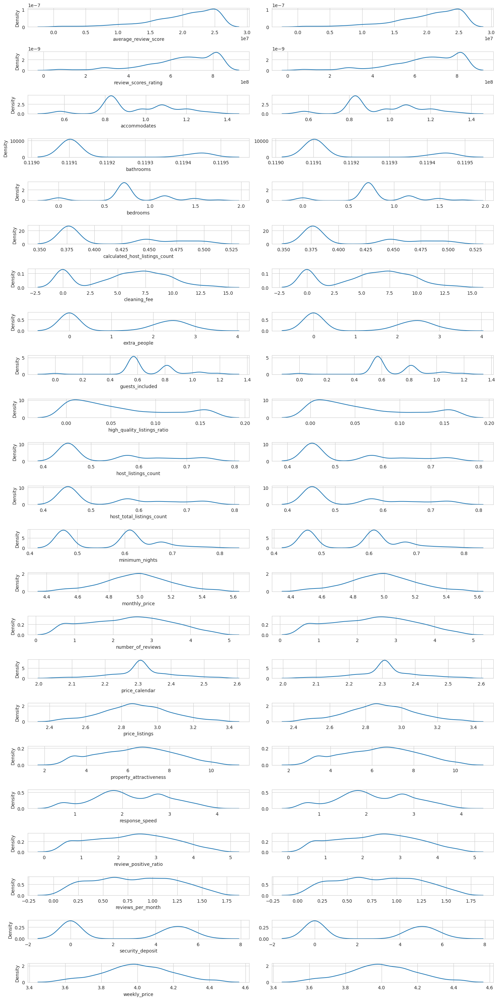

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import yeojohnson, boxcox

# Assuming 'df' is your DataFrame and 'log_cols' is defined
log_cols = ['average_review_score', 'review_scores_rating', 'accommodates', 'bathrooms',
    'bedrooms', 'calculated_host_listings_count', 'cleaning_fee', 'extra_people',
    'guests_included', 'high_quality_listings_ratio', 'host_listings_count',
    'host_total_listings_count', 'minimum_nights', 'monthly_price', 'number_of_reviews',
    'price_calendar', 'price_listings', 'property_attractiveness', 'response_speed',
    'review_positive_ratio', 'reviews_per_month', 'security_deposit', 'weekly_price']

fig, ax = plt.subplots(len(log_cols), 2, figsize=(15, 30))

for i in range(0, len(log_cols)):
    # Yeo-Johnson Transformation
    data, fitted_lambda = yeojohnson(df[log_cols[i]], lmbda=None)
    df[log_cols[i]] = data # Update the column in the DataFrame

    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

### **RobustScaler** (For Outlier)

In [ ]:
from sklearn.preprocessing import RobustScaler

# Initialize the RobustScaler
scaler = RobustScaler()

# Fit and transform the numerical features
df[num_cols] = scaler.fit_transform(df[num_cols])

# Display the scaled DataFrame
df[num_cols]

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,day,month,year,average_review_score,property_attractiveness,review_positive_ratio,booking_frequency,high_quality_listings_ratio,response_speed
0,-1.065885,0.0,-0.416767,1.000000,1.000000,0.244733,-0.973553,0.403380,0.000000,0.000000,0.0,-0.241412,-0.224370,-0.106787,-0.867958,-1.059032,1.000000,0.636770,-1.000000,-0.694698,-0.230769,-0.121951,-0.054545,0.165517,1.315679,-0.163164,0.0,0.0,0.0,0.0,-1.0,0.0,1.000000,0.733999,-1.065885,-0.469669,0.0,0.0,0.0,-0.114288,1.438090,1.330382,-0.165517,-0.487129,1.306826
1,-0.916000,0.0,-0.210147,1.344989,1.344989,0.297669,-0.849324,0.403380,0.000000,0.000000,0.0,0.566935,0.497096,0.111357,0.009145,0.063115,0.000000,0.000000,0.000000,-0.946069,-0.269231,-0.804878,-1.054545,-0.087356,0.596471,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.659011,-0.028065,-0.916000,2.577046,0.0,0.0,0.0,0.117818,0.634988,0.616144,0.087356,-0.292977,0.956644
2,-0.420556,0.0,0.354387,0.692719,0.692719,0.122111,-0.937805,1.497542,0.000360,2.319901,5.0,1.972109,1.889158,1.929726,0.411200,1.243430,2.643103,1.056112,0.731390,-1.000914,-0.730769,-0.975610,-1.036364,-0.413793,0.215082,0.169673,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,-0.199745,-0.420556,2.897934,0.0,0.0,0.0,0.239274,0.244371,0.239783,0.413793,-0.045924,0.580349
4,-1.057934,0.0,-0.392500,0.692719,0.692719,0.181775,-1.007062,0.927274,0.000349,1.734900,2.0,1.873061,1.889158,1.929726,0.350153,0.719925,2.469928,0.926211,-1.000000,0.000000,0.384615,0.341463,0.290909,0.252874,0.535224,-0.615522,-1.0,-1.0,0.0,0.0,-1.0,-1.0,0.000000,-0.360829,-1.057934,2.749485,0.0,0.0,0.0,-0.730373,0.542990,0.533734,-0.252874,-0.262360,1.238031
5,0.136436,0.0,-0.447616,0.000000,0.000000,0.137079,-0.861091,-0.596620,0.000000,0.000000,0.0,0.261058,0.194520,0.350772,-0.867958,0.063115,0.000000,1.101142,-1.000000,-1.022852,-0.769231,-1.121951,-0.854545,-0.036782,0.133821,-0.163164,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.343077,0.136436,0.352643,0.0,0.0,0.0,0.000000,0.156202,0.148085,0.036782,0.026224,-0.082397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3810,-1.061313,0.0,-0.396095,0.000000,0.000000,0.579377,-0.546494,0.698954,0.000000,1.000000,2.0,0.602045,0.646576,0.886294,0.081202,0.472003,1.969923,1.223034,0.000000,-1.015539,-0.269231,-0.073171,-0.018182,-0.381609,-0.463670,-0.615522,-1.0,-2.0,0.0,0.0,0.0,-2.0,0.000000,0.009166,-1.061313,0.000000,0.0,0.0,0.0,-0.822189,-0.462419,-0.463202,0.381609,0.762385,-0.600125
3811,0.687861,0.0,0.116424,0.000000,0.000000,0.648347,-0.409445,0.000000,0.000000,0.000000,0.0,-0.658416,-0.621842,-0.476876,-0.867958,-0.237515,0.000000,0.000000,-1.000000,0.000000,-0.692308,-0.878049,-1.109091,-0.409195,-0.857750,0.719541,-1.0,-2.0,0.0,0.0,0.0,0.0,0.000000,-0.553241,0.687861,-1.177586,0.0,0.0,0.0,0.239274,-0.850606,-0.819540,0.409195,1.241141,-0.606144
3812,-0.404917,0.0,-0.295038,1.000000,1.000000,0.585193,-0.674467,0.403380,0.000000,0.000000,1.0,-0.075296,-0.212249,-0.308899,0.292127,-1.059032,1.000000,0.761013,0.465899,-0.694698,-0.346154,-0.390244,-0.563636,-0.105747,0.856276,0.000000,0.0,0.0,0.0,0.0,-1.0,0.0,1.352124,0.722542,-0.404917,0.000000,0.0,0.0,0.0,0.000000,0.912546,0.876020,0.105747,-0.392899,0.613825
3813,0.587623,0.0,1.061332,1.650317,1.650317,0.767833,-0.698722,0.927274,0.000349,1.734900,2.0,1.629713,1.635451,1.678330,-0.867958,1.174646,0.000000,0.0

In [ ]:
nan_counts = df[num_cols].isna().sum()

print(nan_counts)

has_nan = df[num_cols].isna().any().any()

if has_nan:
    print("Ada nilai NaN yang hadir di kolom numerik yang ditentukan")
else:
    print("Tidak ada nilai NaN yang ditemukan di kolom numerik yang ditentukan.")

id                                0
scrape_id                         0
host_id                           0
host_listings_count               0
host_total_listings_count         0
latitude                          0
longitude                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
price_listings                    0
weekly_price                      0
monthly_price                     0
security_deposit                  0
cleaning_fee                      0
guests_included                   0
extra_people                      0
minimum_nights                    0
maximum_nights                    0
availability_30                   0
availability_60                   0
availability_90                   0
availability_365                  0
number_of_reviews                 0
review_scores_rating              0
review_scores_accuracy            0
review_scores_cleanliness   

### **Distribution Column**


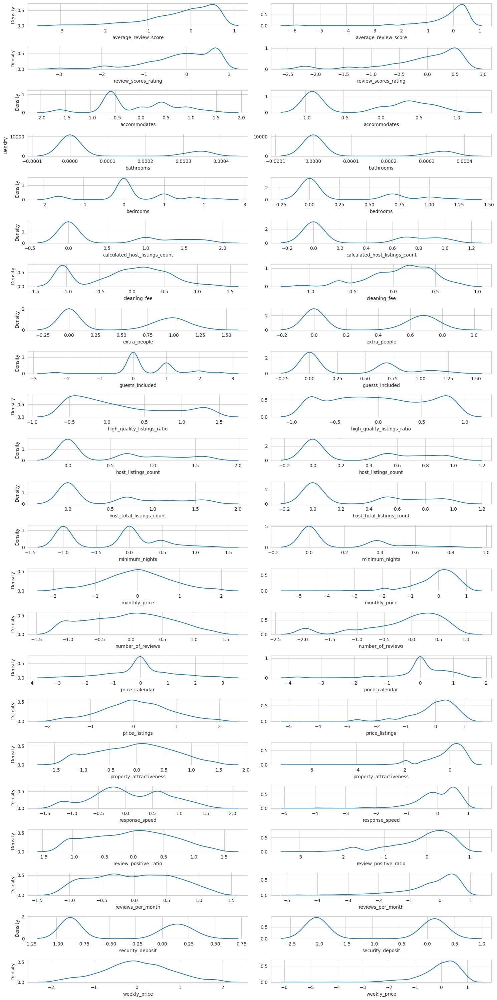

In [ ]:
fig, ax = plt.subplots(len(log_cols),2,figsize=(15,30))
for i in range(0,len(log_cols)):
    kde1 = sns.kdeplot(df[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(np.log(df[log_cols[i]]+1), ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

### **Kesimpulan**

Berdasarkan evaluasi terhadap beberapa fitur yang telah diproses menggunakan teknik scaling dan transformation sebelumnya, dapat disimpulkan bahwa distribusi nilai skewnessnya kini lebih seragam dan tidak menunjukkan variasi yang signifikan. Dengan demikian, dapat dikatakan bahwa penerapan teknik scaling dan transformation pada fitur yang telah dilakukan sudah tepat dan efektif.

## **📌 Feature Encoding (Categoric)**

In [ ]:
for x in df.columns:
    unq = list(df[x].unique())
    try:
        # sorted_unq = sorted(unq) #jangan gunakan sorted
        sorted_unq = unq
    except TypeError:
        sorted_unq = unq
    print(f'===== {x} =====')
    if len(sorted_unq) >= 10:
        print(sorted_unq[:10] + ['.....'])
    else:
        print(sorted_unq)
    print()

===== id =====
[-1.0658847006432677, -0.9160003538009571, -0.42055617215971397, -1.057934065342325, 0.13643612425565338, -0.7150231101228617, -0.9364133228146612, -0.07563894254741527, -0.5920551912665433, -1.0796530689235606, '.....']

===== listing_url =====
['https://www.airbnb.com/rooms/241032', 'https://www.airbnb.com/rooms/953595', 'https://www.airbnb.com/rooms/3308979', 'https://www.airbnb.com/rooms/278830', 'https://www.airbnb.com/rooms/5956968', 'https://www.airbnb.com/rooms/1909058', 'https://www.airbnb.com/rooms/856550', 'https://www.airbnb.com/rooms/4948745', 'https://www.airbnb.com/rooms/2493658', 'https://www.airbnb.com/rooms/175576', '.....']

===== scrape_id =====
[0.0]

===== last_scraped =====
[Timestamp('2016-01-04 00:00:00')]

===== name =====
['Stylish Queen Anne Apartment', 'Bright & Airy Queen Anne Apartment', 'New Modern House-Amazing water view', 'Charming craftsman 3 bdm house', 'Private unit in a 1920s mansion', 'Queen Anne Private Bed and Bath', 'Tiny Garden

### **Label Encoding**

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

categorical_cols = df.select_dtypes(include=['object', 'category','bool']).columns
display(categorical_cols)
label_encoders = {}

for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

df.head()

Index(['listing_url', 'name', 'summary', 'space', 'description',
       'experiences_offered', 'neighborhood_overview', 'notes', 'transit',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_url', 'host_name', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'street', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'is_location_exact',
       'property_type', 'room_type', 'bed_type', 'amenities',
       'calendar_updated', 'has_availability', 'requires_license',
       'jurisdiction_names', 'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dty

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date,day,month,year,average_review_score,property_attractiveness,review_positive_ratio,booking_frequency,high_quality_listings_ratio,response_speed
0,-1.065885,446,0.0,2016-01-04,2738,2882,953,1442,0,2201,1803,2260,0,0,1477,0,-0.416767,2272,804,2011-08-11,79,634,2,39,1,0,653,653,72,1.000000,1.000000,61,1,1,737,81,12,2,0,14,0,3,0,0,0.244733,-0.973553,1,0,0,0.403380,0.000000,0.000000,0.0,4,1240,-0.241412,-0.224370,-0.106787,-0.867958,-1.059032,1.000000,0.636770,-1.00000,-0.694698,16,0,-0.230769,-0.121951,-0.054545,0.165517,2016-01-04,1.315679,2011-11-01,2016-01-02,-0.163164,0.0,0.0,0.0,0.0,-1.0,0.0,0,0,0,1,0,0,1.000000,0.733999,-1.065885,-0.469669,2017-01-02,0.0,0.0,0.0,-0.114288,1.438090,1.330382,-0.165517,-0.487129,1.306826
1,-0.916000,3140,0.0,2016-01-04,564,541,317,594,0,1214,1729,465,165,165,178,165,-0.210147,1831,57,2013-02-21,79,1187,3,41,1,1,527,527,72,1.344989,1.344989,21,1,1,489,81,12,2,0,14,0,3,0,0,0.297669,-0.849324,1,0,0,0.403380,0.000000,0.000000,0.0,4,2286,0.566935,0.497096,0.111357,0.009145,0.063115,0.000000,0.000000,0.00000,-0.946069,29,0,-0.269231,-0.804878,-1.054545,-0.087356,2016-01-04,0.596471,2013-08-19,2015-12-29,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,2,1,1,1.659011,-0.028065,-0.916000,2.577046,2017-01-02,0.0,0.0,0.0,0.117818,0.634988,0.616144,0.087356,-0.292977,0.956644
2,-0.420556,700,0.0,2016-01-04,1946,1467,1229,1579,0,1846,785,117,0,0,3044,0,0.354387,429,579,2014-06-12,79,1781,2,18,1,0,781,781,72,0.692719,0.692719,42,1,1,1258,81,12,2,0,14,0,3,0,0,0.122111,-0.937805,1,9,0,1.497542,0.000360,2.319901,5.0,4,1142,1.972109,1.889158,1.929726,0.411200,1.243430,2.643103,1.056112,0.73139,-1.000914,19,0,-0.730769,-0.975610,-1.036364,-0.413793,2016-01-04,0.215082,2014-07-30,2015-09-03,0.169673,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,2,0,0,1.000000,-0.199745,-0.420556,2.897934,2017-01-02,0.0,0.0,0.0,0.239274,0.244371,0.239783,0.413793,-0.045924,0.580349
4,-1.057934,553,0.0,2016-01-04,810,676,481,736,0,1962,187,1468,0,0,1434,0,-0.392500,317,380,2011-11-29,79,406,3,0,1,0,103,103,72,0.692719,0.692719,27,1,1,62,81,12,2,0,14,0,3,0,0,0.181775,-1.007062,1,9,0,0.927274,0.000349,1.734900,2.0,4,1742,1.873061,1.889158,1.929726,0.350153,0.719925,2.469928,0.926211,-1.00000,0.000000,24,0,0.384615,0.341463,0.290909,0.252874,2016-01-04,0.535224,2012-07-10,2015-10-24,-0.615522,-1.0,-1.0,0.0,0.0,-1.0,-1.0,0,0,0,2,0,0,0.000000,-0.360829,-1.057934,2.749485,2017-01-02,0.0,0.0,0.0,-0.730373,0.542990,0.533734,-0.252874,-0.262360,1.238031
5,0.136436,1609,0.0,2016-01-04,2272,2743,772,2966,0,1820,647,1243,2549,2549,2777,2549,-0.447616,1227,60,2010-12-25,79,1119,3,0,1,0,1998,1998,72,0.000

### **Kesimpulan**

Berdasarkan hasil verifikasi fitur-fitur yang telah diproses menggunakan teknik encoding sebelumnya, diketahui bahwa semua nilai telah berubah menjadi numerik sesuai dengan yang ditentukan. Dengan demikian, dapat disimpulkan bahwa metode fitur encoding yang telah kami terapkan sudah valid dan akurat.

In [ ]:
df.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,listing_id,price_calendar,date,day,month,year,average_review_score,property_attractiveness,review_positive_ratio,booking_frequency,high_quality_listings_ratio,response_speed
0,-1.065885,446,0.0,2016-01-04,2738,2882,953,1442,0,2201,1803,2260,0,0,1477,0,-0.416767,2272,804,2011-08-11,79,634,2,39,1,0,653,653,72,1.000000,1.000000,61,1,1,737,81,12,2,0,14,0,3,0,0,0.244733,-0.973553,1,0,0,0.403380,0.000000,0.000000,0.0,4,1240,-0.241412,-0.224370,-0.106787,-0.867958,-1.059032,1.000000,0.636770,-1.00000,-0.694698,16,0,-0.230769,-0.121951,-0.054545,0.165517,2016-01-04,1.315679,2011-11-01,2016-01-02,-0.163164,0.0,0.0,0.0,0.0,-1.0,0.0,0,0,0,1,0,0,1.000000,0.733999,-1.065885,-0.469669,2017-01-02,0.0,0.0,0.0,-0.114288,1.438090,1.330382,-0.165517,-0.487129,1.306826
1,-0.916000,3140,0.0,2016-01-04,564,541,317,594,0,1214,1729,465,165,165,178,165,-0.210147,1831,57,2013-02-21,79,1187,3,41,1,1,527,527,72,1.344989,1.344989,21,1,1,489,81,12,2,0,14,0,3,0,0,0.297669,-0.849324,1,0,0,0.403380,0.000000,0.000000,0.0,4,2286,0.566935,0.497096,0.111357,0.009145,0.063115,0.000000,0.000000,0.00000,-0.946069,29,0,-0.269231,-0.804878,-1.054545,-0.087356,2016-01-04,0.596471,2013-08-19,2015-12-29,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,2,1,1,1.659011,-0.028065,-0.916000,2.577046,2017-01-02,0.0,0.0,0.0,0.117818,0.634988,0.616144,0.087356,-0.292977,0.956644
2,-0.420556,700,0.0,2016-01-04,1946,1467,1229,1579,0,1846,785,117,0,0,3044,0,0.354387,429,579,2014-06-12,79,1781,2,18,1,0,781,781,72,0.692719,0.692719,42,1,1,1258,81,12,2,0,14,0,3,0,0,0.122111,-0.937805,1,9,0,1.497542,0.000360,2.319901,5.0,4,1142,1.972109,1.889158,1.929726,0.411200,1.243430,2.643103,1.056112,0.73139,-1.000914,19,0,-0.730769,-0.975610,-1.036364,-0.413793,2016-01-04,0.215082,2014-07-30,2015-09-03,0.169673,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,2,0,0,1.000000,-0.199745,-0.420556,2.897934,2017-01-02,0.0,0.0,0.0,0.239274,0.244371,0.239783,0.413793,-0.045924,0.580349
4,-1.057934,553,0.0,2016-01-04,810,676,481,736,0,1962,187,1468,0,0,1434,0,-0.392500,317,380,2011-11-29,79,406,3,0,1,0,103,103,72,0.692719,0.692719,27,1,1,62,81,12,2,0,14,0,3,0,0,0.181775,-1.007062,1,9,0,0.927274,0.000349,1.734900,2.0,4,1742,1.873061,1.889158,1.929726,0.350153,0.719925,2.469928,0.926211,-1.00000,0.000000,24,0,0.384615,0.341463,0.290909,0.252874,2016-01-04,0.535224,2012-07-10,2015-10-24,-0.615522,-1.0,-1.0,0.0,0.0,-1.0,-1.0,0,0,0,2,0,0,0.000000,-0.360829,-1.057934,2.749485,2017-01-02,0.0,0.0,0.0,-0.730373,0.542990,0.533734,-0.252874,-0.262360,1.238031
5,0.136436,1609,0.0,2016-01-04,2272,2743,772,2966,0,1820,647,1243,2549,2549,2777,2549,-0.447616,1227,60,2010-12-25,79,1119,3,0,1,0,1998,1998,72,0.000

## **📌 Data Splitting**

In [ ]:
from sklearn.model_selection import train_test_split

# splitting tha data
df_train, df_test = train_test_split(df, test_size=0.20, stratify=df[['host_is_superhost']], random_state=42)
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

print(df_train.shape)
print(df_test.shape)

(2552, 101)
(639, 101)


## **📌 Feature Selection**

Dalam proses pemilihan fitur, kami menerapkan beberapa metode di mana fitur terbaik yang dihasilkan akan digabungkan dengan metode berikutnya. Kami kemudian mengidentifikasi fitur-fitur yang sudah ada sebelumnya dan menambahkan fitur-fitur yang belum termasuk dalam fitur terbaik tersebut.

### **1. Drop Unnecessary Feature**

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2552 entries, 0 to 2551
Columns: 101 entries, id to response_speed
dtypes: datetime64[ns](6), float64(45), int64(50)
memory usage: 2.0 MB


In [ ]:
df_train.drop(['id', 'listing_url', 'host_url', 'listing_id', 'host_id', 'street', 'notes', 'picture_url', 'xl_picture_url', 'host_picture_url','host_thumbnail_url', 'neighborhood_overview', 'transit','host_location','host_about','host_neighbourhood',
               'host_verifications', 'scrape_id', 'last_scraped', 'name', 'thumbnail_url', 'medium_url', 'host_name', 'experiences_offered','host_since','date', 'calendar_last_scraped', 'first_review', 'last_review' ], axis=1, inplace=True)

df_test.drop(['id', 'listing_url', 'host_url', 'listing_id', 'host_id', 'street', 'notes', 'picture_url', 'xl_picture_url', 'host_picture_url','host_thumbnail_url', 'neighborhood_overview', 'transit','host_location','host_about','host_neighbourhood',
               'host_verifications', 'scrape_id', 'last_scraped', 'name', 'thumbnail_url', 'medium_url', 'host_name', 'experiences_offered','host_since','date', 'calendar_last_scraped', 'first_review', 'last_review'], axis=1, inplace=True)

* Informasi URL dan Identitas: Kolom seperti listing_url, host_url, dan ID tidak relevan karena tidak berkontribusi pada analisis atau pembelajaran model.

* Informasi Visual dan Deskriptif: Kolom seperti picture_url, host_picture_url, dan neighborhood_overview yang bersifat informatif tetapi tidak terstruktur untuk analisis.

* Informasi Waktu dan Riwayat: Kolom seperti last_scraped, host_since, first_review, dan last_review dihapus untuk menyederhanakan dataset.

* Atribut Tambahan Lainnya: Kolom seperti name, notes, host_name, dan experiences_offered juga dihilangkan karena kurang relevan dalam konteks prediksi.

In [ ]:
df_train

,summary,space,description,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price_listings,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,price_calendar,day,month,year,average_review_score,property_attractiveness,review_positive_ratio,booking_frequency,high_quality_listings_ratio,response_speed
0,1258,925,1355,3,0,1,0,0.000000,0.000000,1,1,47,4,2,0,16,0,3,0,0,-0.257181,0.392469,1,9,0,0.403380,0.000000,0.000000,1.0,4,2424,-0.155557,-0.141907,-0.029550,0.171294,0.063115,0.000000,0.000000,0.0,0.000000,17,0,-0.307692,-0.243902,-0.145455,0.142529,-0.692545,0.719541,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,2,0,0,0.000000,0.112454,-0.326760,0.0,0.0,0.0,0.626250,-0.659433,-0.653891,-0.142529,1.067473,-0.980175
1,1325,148,1426,3,0,1,1,0.000000,0.000000,1,1,4,6,2,0,15,0,3,0,0,-0.155735,-0.281483,0,1,1,-1.610246,0.000000,0.000000,0.0,4,1079,-0.155557,-0.141907,-0.029550,-0.867958,0.271425,0.000000,0.000000,-1.0,-1.015539,7,0,0.384615,0.341463,0.290909,0.252874,0.262748,0.169673,-1.0,0.0,0.0,0.0,0.0,-1.0,0,0,1,1,0,0,0.000000,0.538473,-0.326760,0.0,0.0,0.0,0.000000,0.286117,0.287463,-0.252874,-0.084801,-0.080048
2,275,1805,308,1,0,1,0,0.000000,0.000000,1,0,21,11,2,0,2,0,3,0,0,0.581226,-0.317367,1,0,0,-0.596620,0.000000,-1.616988,0.0,4,1366,0.124665,0.128874,-0.589766,-0.867958,-0.147836,1.000000,0.000000,-1.0,-0.699269,14,0,-0.615385,-0.609756,-0.418182,0.068966,-0.304050,0.169673,0.0,0.0,0.0,0.0,0.0,-1.0,0,0,0,2,0,0,0.000000,-0.437811,0.000000,0.0,0.0,0.0,0.117818,-0.275047,-0.279289,-0.068966,0.539532,0.100087
3,1905,2391,2042,3,0,1,0,1.000000,1.000000,1,0,56,8,2,0,17,0,3,0,0,1.782529,0.586481,1,9,1,-0.596620,0.000000,0.000000,0.0,2,403,-0.930052,-1.121143,-1.179576,-0.867958,-0.477369,1.000000,1.000000,-1.0,-1.015539,0,0,0.384615,0.341463,0.290909,0.252874,-0.129994,0.000000,0.0,0.0,0.0,0.0,-1.0,0.0,0,0,0,2,0,0,1.352124,0.066586,-1.650828,0.0,0.0,0.0,0.000000,-0.105923,-0.110435,-0.252874,0.312343,-0.193412
4,2155,2551,2314,3,0,1,1,0.692719,0.692719,1,1,17,3,2,0,1,0,3,0,0,0.377367,0.074375,1,0,0,-0.596620,0.000000,0.000000,0.0,4,1033,0.454362,0.450913,0.530575,0.203242,0.174558,1.000000,0.000000,0.0,-1.009141,17,0,0.038462,-0.170732,-0.090909,-0.712644,1.308265,0.719541,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,2,0,0,1.000000,0.868719,0.000000,0.0,0.0,0.0,0.626250,1.450697,1.346963,0.712644,-0.486171,1.167540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547,2468,1838,2657,3,0,1,0,0.000000,0.000000,1,1,56,8,2,0,17,0,3,0,0,1.782529,0.672374,1,9,1,-0.596620,0.000000,0.000000,0.0,4,448,-0.930052,-0.878272,-0.713793,-0.867958,-1.059032,0.000000,0.820069,-1.0,-1.002742,16,0,0.384615,0.341463,0.290909,0.252874,0.935798,-1.138547,-1.0,-1.0,-1.0,0.0,-1.0,-1.0,0,0,0,1,0,0,0.000000,0.662487,-1.650828,0.0,0.0,0.0,-1.161223,0.957422,0.913385,-0.252874,-0.548299,0.791034
2548,1745,624,1875,2,0,1,0,0.000000,0.000000,1,1,26,11,2,0,2,0,3,0,0,1.181534,-0.487231,1,3,0,

Hasil fitur berkurang dari 101 kolom menjadi 72 kolom

### **2. Univariate Selection**

In [ ]:
# define X and y
X_train = df_train.drop(['host_is_superhost'], axis=1) #features
y_train = df_train['host_is_superhost'] #target

- #### **ANOVA F-value**

`ANOVA F-value` memperkirakan derajat linearitas antara fitur input (yaitu, fitur independen) dan fitur output (yaitu, fitur dependen). Nilai F yang tinggi menunjukkan derajat linearitas yang tinggi dan nilai F yang rendah menunjukkan derajat linearitas yang rendah.

Scikit-learn menyediakan dua fungsi untuk menghitung nilai F:

1. `sklearn.feature_selection.f_regression` for regression problems
2. `sklearn.feature_selection.f_classif` for classification problems

Kekurangan:

Nilai F ANOVA hanya menangkap hubungan linear antara fitur input dan fitur output.|

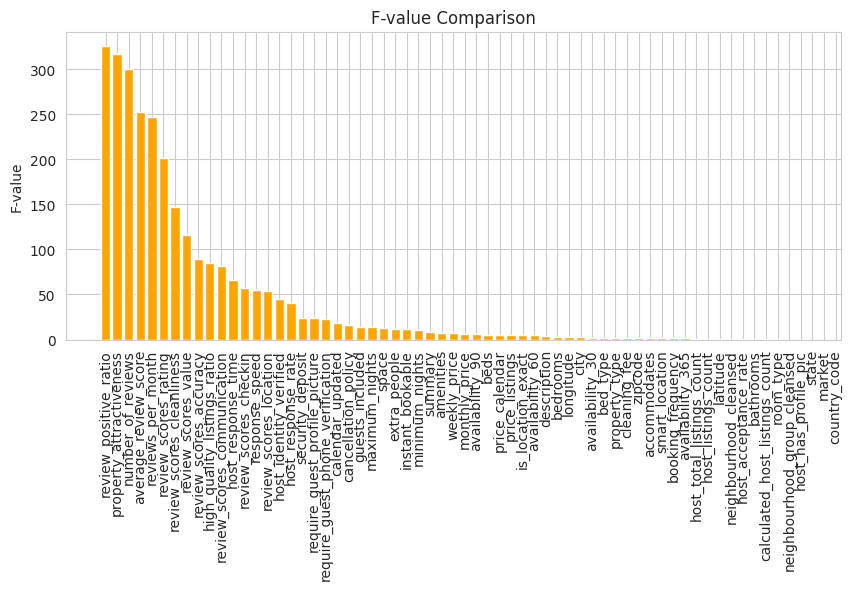

In [ ]:
from sklearn.feature_selection import f_classif
feature_names = X_train.columns

# create f_classif object
f_value = f_classif(X_train, y_train)

# print the name and F-value of each feature
# for feature in zip(feature_names, f_value[0]):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "f_value":f_value[0]
}).sort_values("f_value", ascending=False)

# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="f_value", color="orange")
plt.xticks(rotation="vertical")
plt.ylabel("F-value")
plt.title("F-value Comparison")
plt.show()

* Mengambil 20 top feature

In [ ]:
feature_importance = []
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification']

Untuk metode awal kita mengambil 20 fitur terbaik.

- #### **Variance Threshold**

Variance Threshold menghapus fitur-fitur yang variansinya di bawah nilai `threshold` yang telah ditentukan. Secara default, ini menghapus semua fitur dengan varians nol, yaitu fitur yang memiliki nilai yang sama di semua sampel.

Keuntungan:

Ini dapat digunakan untuk pembelajaran tanpa pengawasan (unsupervised learning).

Kekurangan:

Variance Threshold hanya mempertimbangkan hubungan antar fitur, tetapi tidak mempertimbangkan hubungan antara fitur input dengan fitur output.

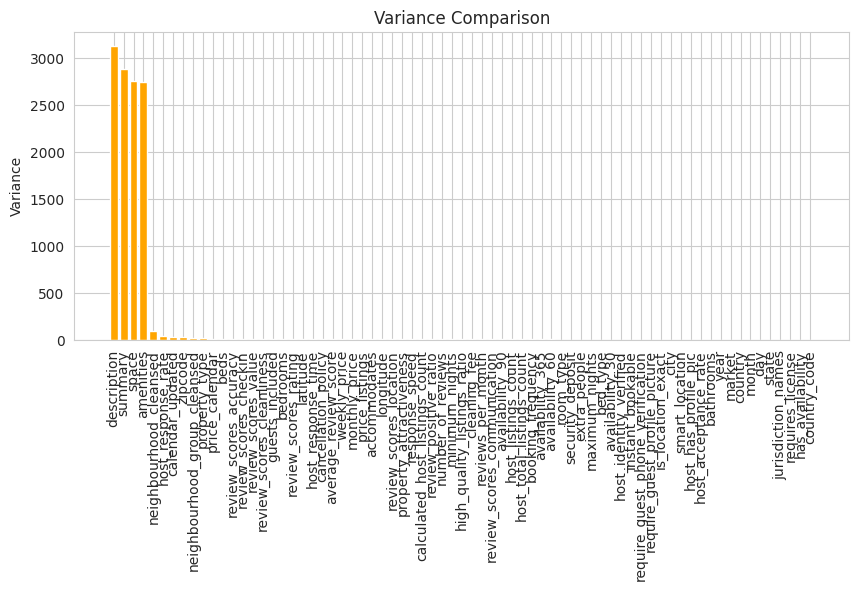

In [ ]:
# import VarianceThreshold
from sklearn.feature_selection import VarianceThreshold
# create VarianceThreshold object
selector = VarianceThreshold(threshold=0.0)
# train and transform
selector.fit_transform(X_train)
# print the name and variance of each feature
# for feature in zip(feature_names, selector.variances_):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "variances":selector.variances_
}).sort_values("variances", ascending=False)

# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="variances", color="orange")
plt.xticks(rotation="vertical")
plt.ylabel("Variance")
plt.title("Variance Comparison")
plt.show()

In [ ]:
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification',
 'description',
 'summary',
 'space',
 'amenities',
 'neighbourhood_cleansed',
 'calendar_updated',
 'zipcode',
 'neighbourhood_group_cleansed',
 'property_type',
 'price_calendar',
 'beds',
 'guests_included',
 'bedrooms',
 'latitude']

penambahan terlihat setelah **'require_guest_profile_picture'**


- #### **Mutual information**

Informasi mutual (MI) mengukur ketergantungan satu variabel terhadap variabel lainnya dengan mengkuantifikasi jumlah informasi yang diperoleh tentang satu fitur melalui fitur lainnya. MI bersifat simetris dan tidak negatif, serta sama dengan nol jika dan hanya jika dua variabel acak independen, dan nilai yang lebih tinggi menunjukkan ketergantungan yang lebih tinggi.

Scikit-learn menyediakan dua fungsi untuk menghitung nilai MI:

- `sklearn.feature_selection.mutual_info_regression` for regression problems
- `sklearn.feature_selection.mutual_info_classif` for classification problems

Keuntungan:

MI dapat menangkap hubungan non-linear antara fitur input dan fitur output.

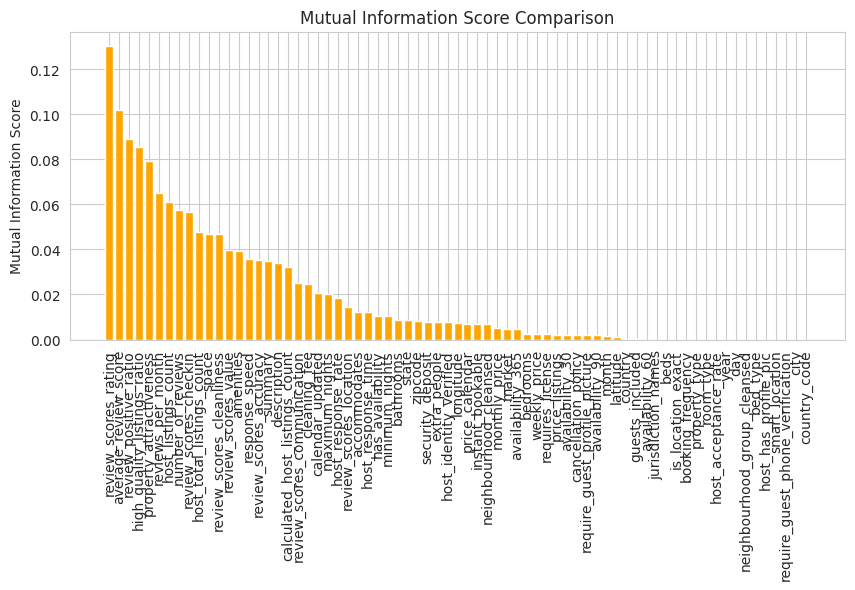

In [ ]:
# import mutual_info_classif
from sklearn.feature_selection import mutual_info_classif
# create mutual_info_classif object
MI_score = mutual_info_classif(X_train, y_train, random_state=0)
# Print the name and mutual information score of each feature
# for feature in zip(feature_names, MI_score):
#     print(feature)

fs = pd.DataFrame({
    "feature_names":feature_names,
    "MI_score":MI_score
}).sort_values("MI_score", ascending=False)

# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=fs, x="feature_names", height="MI_score", color="orange")
plt.xticks(rotation="vertical")
plt.ylabel("Mutual Information Score")
plt.title("Mutual Information Score Comparison")
plt.show()

In [ ]:
for i in fs["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification',
 'description',
 'summary',
 'space',
 'amenities',
 'neighbourhood_cleansed',
 'calendar_updated',
 'zipcode',
 'neighbourhood_group_cleansed',
 'property_type',
 'price_calendar',
 'beds',
 'guests_included',
 'bedrooms',
 'latitude',
 'host_listings_count',
 'host_total_listings_count',
 'calculated_host_listings_count']

Dalam metode Mutual information dari visualisasi grafik banyak fitur yang memiliki nilai terbaik, oleh karena itu kita hanya mengambil 10 fitur saja.
Penambahan terlihat setelah fitur **'property_type'**. Ada 2 fitur tambahan.

- #### **Scikit-learn’s SelectKBest**

SelectKBest memilih fitur-fitur menggunakan sebuah fungsi (dalam hal ini nilai F ANOVA) dan kemudian "menghapus semua kecuali k fitur dengan skor tertinggi".

Uji statistik dapat digunakan untuk memilih fitur-fitur yang memiliki hubungan terkuat dengan variabel output. `Mutual information, ANOVA F-test dan chi square` adalah beberapa metode paling populer untuk Univariate Feature Selection.

---

Jika transformasi data tidak memungkinkan karena suatu alasan (misalnya, nilai negatif adalah faktor penting), maka kita harus memilih statistik lain untuk menilai fitur kita:

```
sklearn.feature_selection.f_classif computes ANOVA f-value
sklearn.feature_selection.mutual_info_classif
```

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif

# apply SelectKBest class to extract top 10 best features

# computes chi2
# semuanya harus positif
# bestfeatures = SelectKBest(score_func=chi2, k=10)

# computes ANOVA f-value
bestfeatures = SelectKBest(score_func=f_classif, k=10)

fit = bestfeatures.fit(X_train, y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_train.columns)
#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
featureScores.sort_values('Score', ascending=False, inplace=True)
print(featureScores.nlargest(10,'Score'))  #print 10 best features

                          Specs       Score
67        review_positive_ratio  325.664137
66      property_attractiveness  316.931972
45            number_of_reviews  300.856000
65         average_review_score  253.105292
60            reviews_per_month  246.587111
46         review_scores_rating  201.579632
48    review_scores_cleanliness  147.149868
52          review_scores_value  116.305732
47       review_scores_accuracy   88.927315
69  high_quality_listings_ratio   84.895438


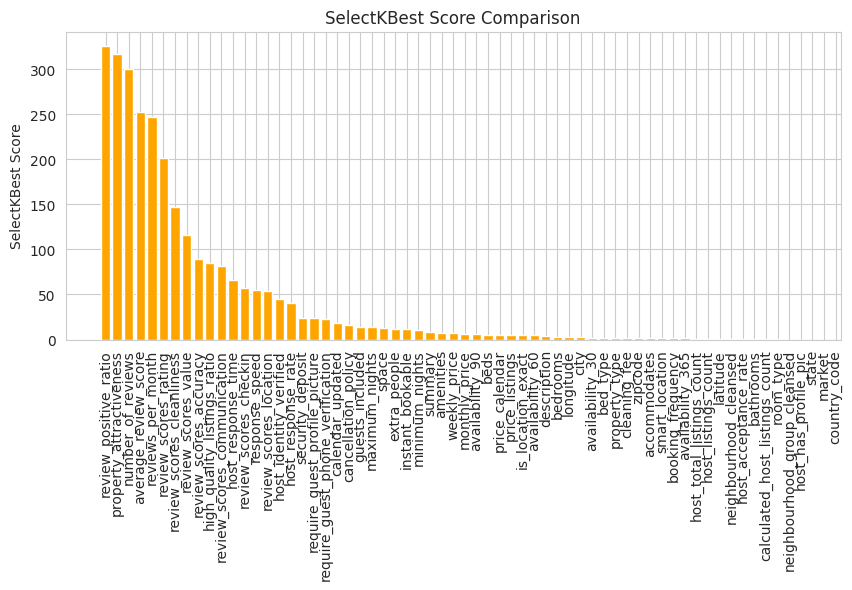

In [ ]:
# Create a bar chart
plt.figure(figsize=(10,4))
plt.bar(data=featureScores, x="Specs", height="Score", color="orange")
plt.xticks(rotation="vertical")
plt.ylabel("SelectKBest Score")
plt.title("SelectKBest Score Comparison")
plt.show()

In [ ]:
for i in featureScores["Specs"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification',
 'description',
 'summary',
 'space',
 'amenities',
 'neighbourhood_cleansed',
 'calendar_updated',
 'zipcode',
 'neighbourhood_group_cleansed',
 'property_type',
 'price_calendar',
 'beds',
 'guests_included',
 'bedrooms',
 'latitude',
 'host_listings_count',
 'host_total_listings_count',
 'calculated_host_listings_count']

In [ ]:
df_train[feature_importance]

,review_positive_ratio,property_attractiveness,number_of_reviews,average_review_score,reviews_per_month,review_scores_rating,review_scores_cleanliness,review_scores_value,review_scores_accuracy,high_quality_listings_ratio,review_scores_communication,host_response_time,review_scores_checkin,response_speed,review_scores_location,host_identity_verified,host_response_rate,security_deposit,require_guest_profile_picture,require_guest_phone_verification,description,summary,space,amenities,neighbourhood_cleansed,calendar_updated,zipcode,neighbourhood_group_cleansed,property_type,price_calendar,beds,guests_included,bedrooms,latitude,host_listings_count,host_total_listings_count,calculated_host_listings_count
0,-0.653891,-0.659433,-0.692545,0.626250,0.112454,0.719541,0.0,0.0,0.0,1.067473,0.0,3,0.0,-0.980175,0.0,1,0,0.171294,0,0,1355,1258,925,2424,47,17,16,4,9,-0.326760,1.0,0.000000,0.000000,-0.257181,0.000000,0.000000,0.000000
1,0.287463,0.286117,0.262748,0.000000,0.538473,0.169673,0.0,-1.0,-1.0,-0.084801,0.0,3,0.0,-0.080048,0.0,1,0,-0.867958,0,0,1426,1325,148,1079,4,7,15,6,1,-0.326760,0.0,0.000000,0.000000,-0.155735,0.000000,0.000000,0.000000
2,-0.279289,-0.275047,-0.304050,0.117818,-0.437811,0.169673,0.0,-1.0,0.0,0.539532,0.0,1,0.0,0.100087,0.0,0,0,-0.867958,0,0,308,275,1805,1366,21,14,2,11,0,0.000000,0.0,1.000000,-1.616988,0.581226,0.000000,0.000000,0.000000
3,-0.110435,-0.105923,-0.129994,0.000000,0.066586,0.000000,0.0,0.0,0.0,0.312343,0.0,3,0.0,-0.193412,-1.0,0,0,-0.867958,0,0,2042,1905,2391,403,56,0,17,8,9,-1.650828,0.0,1.000000,0.000000,1.782529,1.000000,1.000000,1.352124
4,1.346963,1.450697,1.308265,0.626250,0.868719,0.719541,0.0,0.0,0.0,-0.486171,0.0,3,0.0,1.167540,0.0,1,0,0.203242,0,0,2314,2155,2551,1033,17,17,1,3,0,0.000000,0.0,1.000000,0.000000,0.377367,0.692719,0.692719,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547,0.913385,0.957422,0.935798,-1.161223,0.662487,-1.138547,-1.0,-1.0,-1.0,-0.548299,0.0,3,-1.0,0.791034,-1.0,1,0,-0.867958,0,0,2657,2468,1838,448,56,16,17,8,9,-1.650828,0.0,0.000000,0.000000,1.782529,0.000000,0.000000,0.000000
2548,-0.550158,-0.541684,-0.566017,0.000000,-0.395087,-0.163164,0.0,0.0,0.0,0.904176,0.0,2,0.0,-0.341713,0.0,1,0,-0.867958,0,0,1875,1745,624,314,26,16,2,11,3,-0.326760,0.0,0.000000,-1.616988,1.181534,0.000000,0.000000,0.000000
2549,-0.902848,-0.907651,-0.857750,-1.526688,-0.586347,-1.948922,0.0,0.0,-1.0,-0.548299,0.0,2,0.0,-0.564647,-1.0,0,0,0.203242,0,0,1118,1040,181,451,27,29,19,10,9,-0.624228,1.0,0.000000,0.000000,1.563606,1.000000,1.000000,1.352124
2550,1.071035,1.128822,1.036544,0.493395,0.555395,0.529252,0.0,0.0,0.0,-0.439683,0.0,3,0.0,1.045839,0.0,1,0,0.292127,0,0,797,738,1367,1129,19,29,21,16,9,0.513396,1.0,1.969923,0.000000,-1.800551,0.000000,0.000000,0.000000


Menghasilkan 8 fitur tambahan.

- #### **WOE**

Weight of Evidence (WOE) adalah metode yang digunakan untuk mengukur seberapa kuat hubungan antara variabel independen kategorikal (prediktor) dengan variabel target yang bersifat biner (0 atau 1). WOE bekerja dengan cara menghitung logaritma dari rasio peluang (odds ratio) antara jumlah kejadian positif (1) dan negatif (0) dalam setiap kategori variabel independen. Dengan kata lain, WOE membantu memahami seberapa baik suatu kategori dalam variabel prediktor dapat memengaruhi atau memprediksi hasil superhost (1) atau bukan superhost (0) pada variabel target.

In [ ]:
# data = df_train  # Menggunakan data df_train
# TARGET_COLUMN = 'host_is_superhost'  # Target kolom untuk WOE

# # Fungsi untuk menghitung WOE secara manual
# def calculate_woe(data, feature, target):
#     temp = data[[feature, target]].copy()
#     temp['total'] = 1

#     # Membuat tabel agregasi
#     agg = temp.groupby(feature).agg({
#         target: 'sum',  # Jumlah positif (target = 1)
#         'total': 'count'  # Total observasi di setiap grup
#     }).reset_index()

#     # Menambahkan jumlah negatif (target = 0)
#     agg['negative'] = agg['total'] - agg[target]

#     # Menghindari pembagian nol dengan menambahkan epsilon kecil
#     agg['positive_dist'] = agg[target] / agg[target].sum()
#     agg['negative_dist'] = agg['negative'] / agg['negative'].sum()

#     # Menghitung WOE
#     agg['woe'] = np.log((agg['positive_dist'] + 1e-10) / (agg['negative_dist'] + 1e-10))

#     # Menghindari nilai WOE yang tidak valid (misalnya, inf)
#     agg['woe'].replace([np.inf, -np.inf], 0, inplace=True)

#     return agg[[feature, 'woe']]

# # Menghitung WOE untuk setiap fitur dalam data kecuali target
# columns_to_transform = [col for col in data.columns if col != TARGET_COLUMN]
# woe_results = {}

# for column in columns_to_transform:
#     # Periksa tipe data dan binning untuk data numerik
#     if data[column].dtype in ['int64', 'float64']:
#         # Binning fitur numerik dengan kuantil
#         data[column] = pd.qcut(data[column], q=5, duplicates='drop', labels=False)
#     if data[column].dtype in ['int64', 'float64', 'object']:
#         try:
#             woe_df = calculate_woe(data, column, TARGET_COLUMN)
#             woe_results[column] = woe_df
#         except Exception as e:
#             print(f"Skipping WOE calculation for '{column}' due to error: {e}")

# # Menampilkan kolom berdasarkan total nilai WOE terbesar hingga terkecil
# woe_totals = {}
# for column, woe_df in woe_results.items():
#     total_woe = woe_df['woe'].abs().sum()  # Menggunakan nilai absolut dari WOE
#     woe_totals[column] = total_woe

# # Urutkan berdasarkan total WOE
# sorted_columns = sorted(woe_totals.items(), key=lambda x: x[1], reverse=True)

# # Membuat DataFrame hasil WOE
# woe_totals_df = pd.DataFrame(sorted_columns, columns=['Column', 'Total WOE'])

# # Menampilkan fitur teratas (20 fitur dengan WOE terbesar)
# top_20_woe_features = woe_totals_df.head(20)
# print("\n20 Fitur dengan Total WOE Terbesar:")
# top_20_woe_features

In [ ]:
# # Membuat barchart
# plt.figure(figsize=(10, 4))
# plt.bar(data=top_20_woe_features, x="Column", height="Total WOE", color="orange")
# plt.xticks(rotation="vertical")
# plt.ylabel("Total WOE", fontsize=12)
# plt.title("Top 20 Features Based on Total WOE", fontsize=14)
# plt.show()

In [ ]:
# for i in top_20_woe_features["Column"].values[:20]:
#     if i not in feature_importance:
#         feature_importance.append(i)
# feature_importance

In [ ]:
# df_train[feature_importance]

Hasil dari Woe Method terdapat 7 fitur tambahan

### **3. Feature Importance**

Kita dapat memperoleh tingkat kepentingan setiap fitur dalam dataset dengan menggunakan properti feature importance dari model yang digunakan.

Feature importance memberikan skor untuk setiap fitur dalam data. Semakin tinggi skor yang diberikan, semakin penting atau relevan fitur tersebut terhadap variabel target (output).

Feature importance merupakan kelas bawaan yang tersedia pada algoritma berbasis pohon keputusan (Tree-Based Classifiers). Dalam hal ini, kita akan menggunakan algoritma Extra Trees Classifier untuk mengekstraksi 10 fitur teratas dari dataset.

[0.01542638 0.01611596 0.01382939 0.01604652 0.01406011 0.
 0.01921139 0.01954069 0.00053959 0.00992431 0.01492786 0.01401185
 0.00015798 0.         0.01500553 0.         0.00014175 0.
 0.         0.0138257  0.01576088 0.00523696 0.01340623 0.00900963
 0.01279465 0.0091717  0.00984144 0.01125521 0.00330916 0.01566193
 0.01383885 0.01492628 0.01576247 0.01562048 0.01398046 0.01174071
 0.01506215 0.01499559 0.01335874 0.01615171 0.         0.01274452
 0.01298961 0.01389445 0.01507571 0.04546089 0.05364322 0.01797683
 0.02607834 0.01122135 0.00895098 0.01392436 0.02699601 0.
 0.         0.00908526 0.01421574 0.00903407 0.00918278 0.01436975
 0.03514192 0.01383187 0.         0.         0.         0.05631306
 0.03518093 0.04291284 0.01428921 0.03425233 0.01958371]


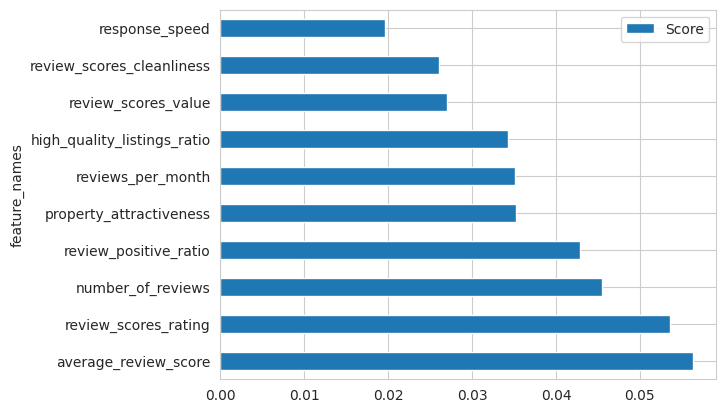

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X_train,y_train)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X_train.columns)
feat_importances = pd.DataFrame(feat_importances).reset_index(names="feature_names") \
    .rename(columns={0:"Score"}) \
    .sort_values("Score", ascending=False).reset_index(drop=True)
feat_importances.nlargest(10, "Score").plot(x="feature_names", y="Score", kind='barh')
plt.show()

In [ ]:
for i in feat_importances["feature_names"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification',
 'description',
 'summary',
 'space',
 'amenities',
 'neighbourhood_cleansed',
 'calendar_updated',
 'zipcode',
 'neighbourhood_group_cleansed',
 'property_type',
 'price_calendar',
 'beds',
 'guests_included',
 'bedrooms',
 'latitude',
 'host_listings_count',
 'host_total_listings_count',
 'calculated_host_listings_count',
 'monthly_price',
 'longitude']

### **4. Correlation Matrix with Heatmap**

Definisi Korelasi:
Korelasi menunjukkan bagaimana suatu fitur saling berhubungan satu sama lain atau terhadap variabel target. Korelasi dapat bersifat:

* Positif: Peningkatan nilai pada satu fitur menyebabkan peningkatan nilai pada variabel target.

* Negatif: Peningkatan nilai pada satu fitur menyebabkan penurunan nilai pada variabel target.

* Visualisasi dengan Heatmap:
Heatmap membantu kita mengidentifikasi fitur mana yang memiliki hubungan paling kuat dengan variabel target. Untuk itu, kita akan memvisualisasikan korelasi antar fitur menggunakan heatmap dari library Seaborn.

* Mengatasi Redundansi Antar Fitur:
Dalam analisis korelasi antar fitur, penting untuk memeriksa adanya fitur yang saling redundan (memiliki korelasi tinggi satu sama lain). Dalam kasus tersebut, salah satu fitur dapat dihapus, terutama fitur dengan korelasi rendah terhadap variabel target (response). Hal ini bertujuan untuk mengurangi multikolinearitas dan meningkatkan efisiensi model.

<Axes: >

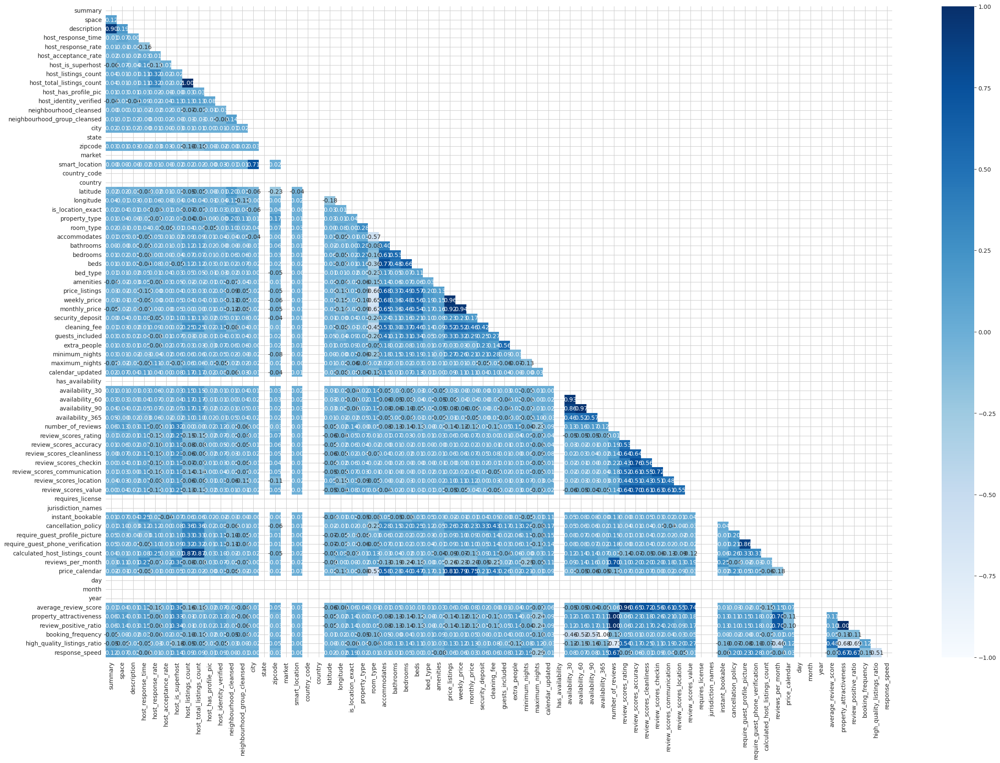

In [ ]:
plt.figure(figsize=(30,20))
corr = df_train.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool_))
sns.heatmap(corr, cmap='Blues', annot=True, fmt='.2f', mask=mask)

**Checking Correlation with Target host_is_superhost**

In [ ]:
corr = df_train.corrwith(df_train["host_is_superhost"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr["Corr Type"] = corr["corr value"].apply(lambda x : "Positif" if x >= 0 else "Negatif")
corr["corr value"] = corr["corr value"].apply(lambda x : abs(x))
corr = corr.sort_values('corr value', ascending=False, ignore_index=True)
corr.head(10)

,index,corr value,Corr Type
0,host_is_superhost,1.000000,Positif
1,review_positive_ratio,0.336524,Positif
2,property_attractiveness,0.332487,Positif
3,number_of_reviews,0.324857,Positif
4,average_review_score,0.300491,Positif
5,reviews_per_month,0.296942,Positif
6,review_scores_rating,0.270665,Positif
7,review_scores_cleanliness,0.233576,Positif
8,review_scores_value,0.208855,Positif
9,review_scores_accuracy,0.183571,Positif


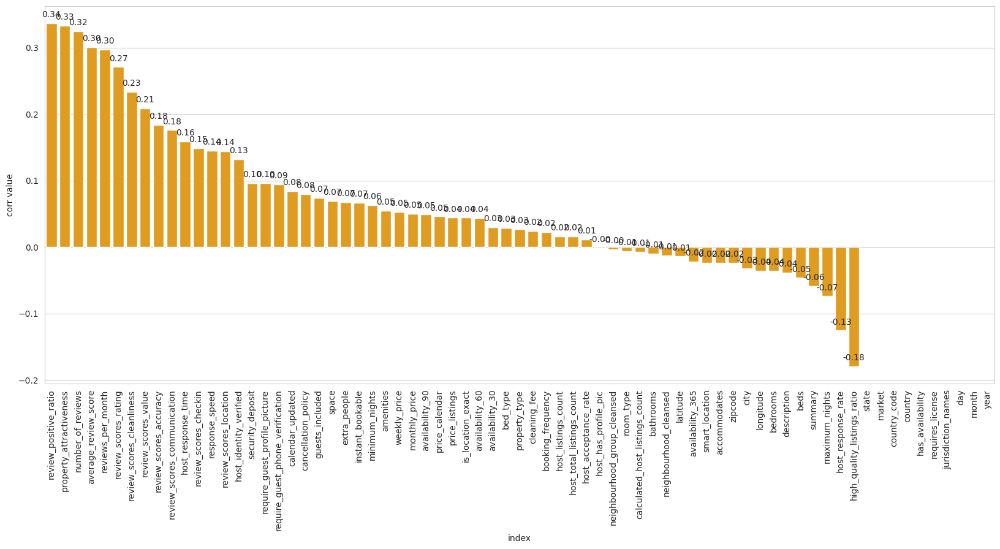

In [ ]:
corr = df_train.corrwith(df_train["host_is_superhost"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr = corr.sort_values('corr value', ascending=False)[1:]

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='index', y="corr value", data=corr, order=corr["index"], color='orange')
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():0.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center',
        va = 'center',
        xytext = (0, 10),
        fontsize=10,
        textcoords = 'offset points')
plt.xticks(rotation=90)
plt.show()

In [ ]:
target = "host_is_superhost"
high_corr_cols = [i for i in list(corr[corr["corr value"] > 0.15]["index"].values) if i != target]
print(high_corr_cols)

['review_positive_ratio', 'property_attractiveness', 'number_of_reviews', 'average_review_score', 'reviews_per_month', 'review_scores_rating', 'review_scores_cleanliness', 'review_scores_value', 'review_scores_accuracy', 'review_scores_communication', 'host_response_time']


#### Mengambil 20 top feature yang memiliki nilai terbaik

In [ ]:
for i in corr["index"].values[:20]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['review_positive_ratio',
 'property_attractiveness',
 'number_of_reviews',
 'average_review_score',
 'reviews_per_month',
 'review_scores_rating',
 'review_scores_cleanliness',
 'review_scores_value',
 'review_scores_accuracy',
 'high_quality_listings_ratio',
 'review_scores_communication',
 'host_response_time',
 'review_scores_checkin',
 'response_speed',
 'review_scores_location',
 'host_identity_verified',
 'host_response_rate',
 'security_deposit',
 'require_guest_profile_picture',
 'require_guest_phone_verification',
 'description',
 'summary',
 'space',
 'amenities',
 'neighbourhood_cleansed',
 'calendar_updated',
 'zipcode',
 'neighbourhood_group_cleansed',
 'property_type',
 'price_calendar',
 'beds',
 'guests_included',
 'bedrooms',
 'latitude',
 'host_listings_count',
 'host_total_listings_count',
 'calculated_host_listings_count',
 'monthly_price',
 'longitude',
 'cancellation_policy']

### **5. Multicollinearity Check (Drop Redundancy)**

Definisi Multikolinearitas:
Multikolinearitas terjadi ketika variabel independen dalam model saling berkorelasi. Kondisi ini dapat:

* Mengurangi kinerja model.
* Menurunkan signifikansi statistik dari variabel independen, sehingga sulit untuk menentukan pengaruh individual suatu fitur terhadap variabel target.


Pemeriksaan Redundansi Fitur:
Dari fitur-fitur yang telah dipilih (hasil gabungan Top 20 Features), kita akan melakukan pengecekan ulang untuk mendeteksi redundansi antar fitur.

Fitur-fitur dengan korelasi antar fitur yang tinggi (di atas ambang batas, misalnya `threshold > 0.70`) akan diidentifikasi.
Selanjutnya, fitur-fitur tersebut akan dibandingkan korelasinya terhadap variabel target. Salah satu fitur dengan korelasi lebih rendah terhadap target akan dihapus untuk mengurangi redundansi.

#### **1. Correlation Coefficient**

<Axes: >

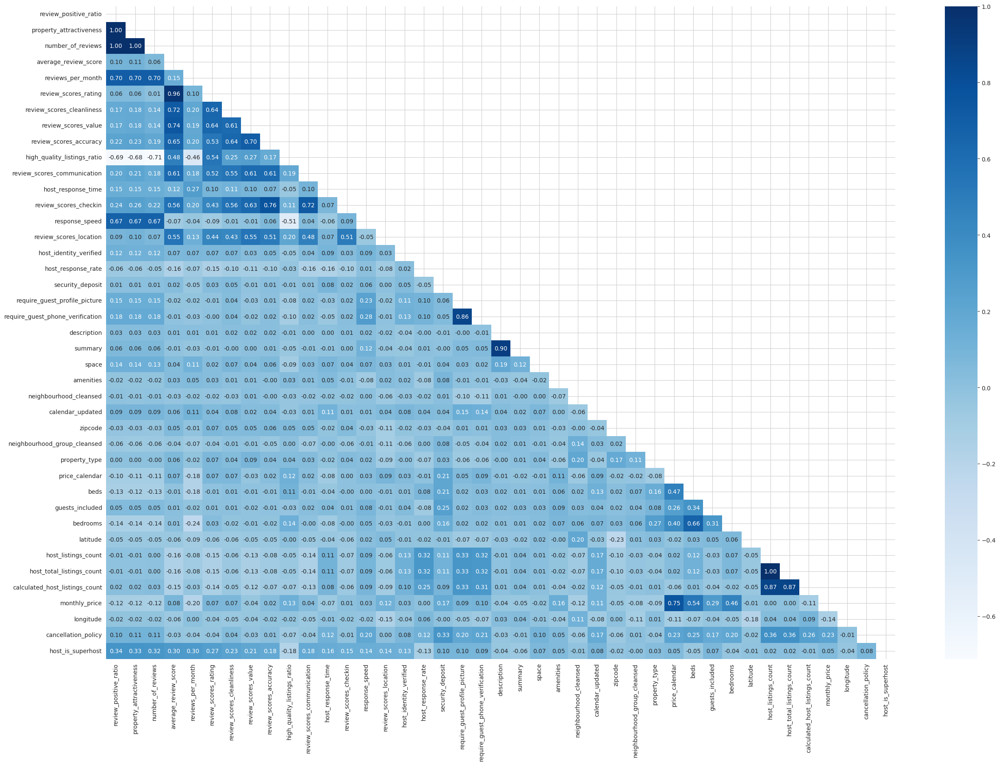

In [ ]:
plt.figure(figsize=(30,20))
corr = df_train[feature_importance+["host_is_superhost"]].corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool_))
sns.heatmap(corr, cmap='Blues', annot=True, fmt='.2f', mask=mask)

**Manampilkan Korelasi Feature > Threshold 0.70**

Akan ada info mengenai Feature apa saja yang perlu di drop

In [ ]:
def corrtarget(x):
    target = "host_is_superhost"
    return df_train[x].corr(df_train[target])

def corrresp(x):
    target = "host_is_superhost"
    col1 = x["A"]
    col2 = x["B"]

    cor1 = df_train[col1].corr(df_train[target])
    cor2 = df_train[col2].corr(df_train[target])

    if cor1 < cor2:
        return col1
    else:
        return col2
    return col1

In [ ]:
corr_matrix = df_train[feature_importance].corr()
target = "host_is_superhost"

# Flatten correlation matrix.
flat_cm = corr_matrix.stack().reset_index()
flat_cm.columns = ['A', 'B', 'correlation']
flat_cm = flat_cm.loc[flat_cm.correlation < 1, :]
flat_cm = flat_cm.sort_values("correlation", ascending=False)
redundan = flat_cm[flat_cm["correlation"] >= 0.7].reset_index(drop=True)
redundan['A vs Target'] = redundan['A'].apply(lambda x: corrtarget(x))
redundan['B vs Target'] = redundan['B'].apply(lambda x: corrtarget(x))
redundan = redundan.drop_duplicates(subset=["correlation"])
redundan["drop"] = redundan.apply(corrresp, axis=1)
redundan

,A,B,correlation,A vs Target,B vs Target,drop
0,review_positive_ratio,property_attractiveness,0.999288,0.336524,0.332487,property_attractiveness
2,number_of_reviews,review_positive_ratio,0.998861,0.324857,0.336524,number_of_reviews
4,number_of_reviews,property_attractiveness,0.998226,0.324857,0.332487,number_of_reviews
6,average_review_score,review_scores_rating,0.964838,0.300491,0.270665,review_scores_rating
8,description,summary,0.900212,-0.038394,-0.058525,summary
10,host_listings_count,calculated_host_listings_count,0.866351,0.015727,-0.007527,calculated_host_listings_count
14,require_guest_phone_verification,require_guest_profile_picture,0.861093,0.093909,0.095904,require_guest_phone_verification
16,review_scores_accuracy,review_scores_checkin,0.759403,0.183571,0.148674,review_scores_checkin
18,monthly_price,price_calendar,0.753897,0.049996,0.045811,price_calendar
20,review_scores_value,average_review_score,0.741174,0.208855,0.300491,review_scores_value


#### **2. VIF (Variance Inflation Factor)**

* Tujuan VIF:
VIF digunakan untuk mendeteksi multikolinearitas dengan menunjukkan sejauh mana varians dari koefisien regresi meningkat akibat adanya korelasi antar prediktor.

* Interpretasi Nilai VIF:

- VIF = 1: Tidak ada korelasi antara fitur dengan prediktor lainnya (kondisi ideal).

- VIF 1 hingga 5: Menunjukkan korelasi yang moderat, masih dapat diterima.

- VIF > 5 atau 10: Menunjukkan tingkat multikolinearitas yang tinggi, memerlukan evaluasi lebih lanjut atau penghapusan fitur.

* Dampak VIF Tinggi:
Nilai VIF yang tinggi mengurangi signifikansi statistik dari variabel independen, sehingga sulit untuk menentukan kontribusi individu dari suatu fitur terhadap model. Oleh karena itu, fitur dengan VIF tinggi perlu dipertimbangkan untuk dihapus guna meningkatkan stabilitas model.

In [ ]:
# calculate VIF scores for each feature
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant

X = add_constant(df_train[feature_importance])

vif_df = pd.DataFrame([vif(X.values, i)
               for i in range(X.shape[1])],
              index=X.columns).reset_index()
vif_df.columns = ['feature','vif_score']
vif_df = vif_df.loc[vif_df.feature!='const']
vif_df['vif_score'] = round(vif_df['vif_score'], 4)
vif_df.sort_values("vif_score", ascending=False, inplace=True)
vif_df

,feature,vif_score
36,host_total_listings_count,inf
35,host_listings_count,inf
3,number_of_reviews,7395.7166
1,review_positive_ratio,6330.0189
2,property_attractiveness,1420.3630
6,review_scores_rating,53.0455
4,average_review_score,47.2496
5,reviews_per_month,38.7359
14,response_speed,36.4373
10,high_quality_listings_ratio,6.1067


In [ ]:
# prompt: cek nilai nan vif_df ada berapa jumlah nya

# Assuming vif_df is already defined as in your provided code.
nan_count = vif_df['vif_score'].isnull().sum()
print(f"Number of NaN values in vif_df['vif_score']: {nan_count}")

Number of NaN values in vif_df['vif_score']: 0


### **Drop Redundant Features**

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant

# Assuming vif_df is already calculated as shown in your provided code

features_to_drop = vif_df[vif_df['vif_score'] > 5]['feature'].tolist()

# Only drop features from feature_importance list
features_to_drop = [feature for feature in features_to_drop if feature in feature_importance]

# Remove redundant features
feature_importance = [feature for feature in feature_importance if feature not in features_to_drop]

print(f"Features dropped due to high VIF: {features_to_drop}")
print(f"Updated feature_importance list: {feature_importance}")

Features dropped due to high VIF: ['host_total_listings_count', 'host_listings_count', 'number_of_reviews', 'review_positive_ratio', 'property_attractiveness', 'review_scores_rating', 'average_review_score', 'reviews_per_month', 'response_speed', 'high_quality_listings_ratio', 'description', 'summary']
Updated feature_importance list: ['review_scores_cleanliness', 'review_scores_value', 'review_scores_accuracy', 'review_scores_communication', 'host_response_time', 'review_scores_checkin', 'review_scores_location', 'host_identity_verified', 'host_response_rate', 'security_deposit', 'require_guest_profile_picture', 'require_guest_phone_verification', 'space', 'amenities', 'neighbourhood_cleansed', 'calendar_updated', 'zipcode', 'neighbourhood_group_cleansed', 'property_type', 'price_calendar', 'beds', 'guests_included', 'bedrooms', 'latitude', 'calculated_host_listings_count', 'monthly_price', 'longitude', 'cancellation_policy']


### **Kesimpulan**

Berdasarkan hasil analisis dan seleksi fitur yang telah dilakukan melalui berbagai teknik feature selection, termasuk:

* Penghapusan Fitur yang Tidak Relevan (Drop Unnecessary Features)

* Seleksi Univariat, meliputi:
 * ANOVA F-value
 * Variance Threshold
 * Mutual Information
 * SelectKBest

* Feature Importance Analysis
* Korelasi Pearson (Pearson Correlation)
* Pemeriksaan Multikolinearitas (Multicollinearity Check) dan Penghapusan Redundansi (Drop Redundancy)

Fitur-fitur yang terpilih untuk digunakan dalam proses pemodelan telah ditentukan sebagai berikut:

In [ ]:
df_train[feature_importance]

,review_scores_cleanliness,review_scores_value,review_scores_accuracy,review_scores_communication,host_response_time,review_scores_checkin,review_scores_location,host_identity_verified,host_response_rate,security_deposit,require_guest_profile_picture,require_guest_phone_verification,space,amenities,neighbourhood_cleansed,calendar_updated,zipcode,neighbourhood_group_cleansed,property_type,price_calendar,beds,guests_included,bedrooms,latitude,calculated_host_listings_count,monthly_price,longitude,cancellation_policy
0,0.0,0.0,0.0,0.0,3,0.0,0.0,1,0,0.171294,0,0,925,2424,47,17,16,4,9,-0.326760,1.0,0.000000,0.000000,-0.257181,0.000000,-0.029550,0.392469,2
1,0.0,-1.0,-1.0,0.0,3,0.0,0.0,1,0,-0.867958,0,0,148,1079,4,7,15,6,1,-0.326760,0.0,0.000000,0.000000,-0.155735,0.000000,-0.029550,-0.281483,1
2,0.0,-1.0,0.0,0.0,1,0.0,0.0,0,0,-0.867958,0,0,1805,1366,21,14,2,11,0,0.000000,0.0,1.000000,-1.616988,0.581226,0.000000,-0.589766,-0.317367,2
3,0.0,0.0,0.0,0.0,3,0.0,-1.0,0,0,-0.867958,0,0,2391,403,56,0,17,8,9,-1.650828,0.0,1.000000,0.000000,1.782529,1.352124,-1.179576,0.586481,2
4,0.0,0.0,0.0,0.0,3,0.0,0.0,1,0,0.203242,0,0,2551,1033,17,17,1,3,0,0.000000,0.0,1.000000,0.000000,0.377367,1.000000,0.530575,0.074375,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547,-1.0,-1.0,-1.0,0.0,3,-1.0,-1.0,1,0,-0.867958,0,0,1838,448,56,16,17,8,9,-1.650828,0.0,0.000000,0.000000,1.782529,0.000000,-0.713793,0.672374,1
2548,0.0,0.0,0.0,0.0,2,0.0,0.0,1,0,-0.867958,0,0,624,314,26,16,2,11,3,-0.326760,0.0,0.000000,-1.616988,1.181534,0.000000,-0.029550,-0.487231,0
2549,0.0,0.0,-1.0,0.0,2,0.0,-1.0,0,0,0.203242,0,0,181,451,27,29,19,10,9,-0.624228,1.0,0.000000,0.000000,1.563606,1.352124,-0.189322,-0.194686,0
2550,0.0,0.0,0.0,0.0,3,0.0,0.0,1,0,0.292127,0,0,1367,1129,19,29,21,16,9,0.513396,1.0,1.969923,0.000000,-1.800551,0.000000,0.768369,-1.261864,2


## **Pemilihan fitur untuk Modelling**
Berdasarkan hasil dari berbagai metode seleksi fitur, kami telah melakukan seleksi tambahan yang disesuaikan dengan kebutuhan bisnis. Fitur yang paling representatif terhadap aspek-aspek utama dalam bisnis ini akan kami pilih untuk digunakan dalam tahap pemodelan.

### **10 Features**

In [ ]:
selected_features = [
    'review_scores_cleanliness',  # Kebersihan
    'review_scores_communication',  # Komunikasi
    'host_response_time',  # Waktu respons
    'review_scores_location',  # Lokasi
    'host_identity_verified',  # Verifikasi identitas
    'monthly_price',  # Harga bulanan
    'require_guest_phone_verification',  # Verifikasi telepon tamu
    'amenities',  # Fasilitas
    'property_type',  # Jenis properti
    'neighbourhood_cleansed'  # Lokasi spesifik
]

# Memilih fitur dari df_train
df_10_features = df_train[selected_features]


In [ ]:
df_10_features

,review_scores_cleanliness,review_scores_communication,host_response_time,review_scores_location,host_identity_verified,monthly_price,require_guest_phone_verification,amenities,property_type,neighbourhood_cleansed
0,0.0,0.0,3,0.0,1,-0.029550,0,2424,9,47
1,0.0,0.0,3,0.0,1,-0.029550,0,1079,1,4
2,0.0,0.0,1,0.0,0,-0.589766,0,1366,0,21
3,0.0,0.0,3,-1.0,0,-1.179576,0,403,9,56
4,0.0,0.0,3,0.0,1,0.530575,0,1033,0,17
...,...,...,...,...,...,...,...,...,...,...
2547,-1.0,0.0,3,-1.0,1,-0.713793,0,448,9,56
2548,0.0,0.0,2,0.0,1,-0.029550,0,314,3,26
2549,0.0,0.0,2,-1.0,0,-0.189322,0,451,9,27
2550,0.0,0.0,3,0.0,1,0.768369,0,1129,9,19


**Pemilihan 10 fitur ini berdasarkan `Kualitas Pengalaman Tamu dan Kepercayaan Host`**

### **15 Features**

In [ ]:
selected_features_15 = [
    'review_scores_cleanliness',  # Kebersihan
    'review_scores_communication',  # Komunikasi
    'host_response_time',  # Waktu respons
    'review_scores_location',  # Lokasi
    'host_identity_verified',  # Verifikasi identitas
    'monthly_price',  # Harga bulanan
    'require_guest_phone_verification',  # Verifikasi telepon tamu
    'amenities',  # Fasilitas
    'property_type',  # Jenis properti
    'neighbourhood_cleansed',  # Lokasi spesifik
    'review_scores_value',  # Nilai yang baik
    'review_scores_checkin',  # Proses check-in
    'host_response_rate',  # Tingkat respons
    'space',  # Deskripsi ruang
    'calendar_updated'  # Pembaruan kalender
]

# Memilih fitur dari df_train
df_15_features = df_train[selected_features_15]
df_15_features

,review_scores_cleanliness,review_scores_communication,host_response_time,review_scores_location,host_identity_verified,monthly_price,require_guest_phone_verification,amenities,property_type,neighbourhood_cleansed,review_scores_value,review_scores_checkin,host_response_rate,space,calendar_updated
0,0.0,0.0,3,0.0,1,-0.029550,0,2424,9,47,0.0,0.0,0,925,17
1,0.0,0.0,3,0.0,1,-0.029550,0,1079,1,4,-1.0,0.0,0,148,7
2,0.0,0.0,1,0.0,0,-0.589766,0,1366,0,21,-1.0,0.0,0,1805,14
3,0.0,0.0,3,-1.0,0,-1.179576,0,403,9,56,0.0,0.0,0,2391,0
4,0.0,0.0,3,0.0,1,0.530575,0,1033,0,17,0.0,0.0,0,2551,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547,-1.0,0.0,3,-1.0,1,-0.713793,0,448,9,56,-1.0,-1.0,0,1838,16
2548,0.0,0.0,2,0.0,1,-0.029550,0,314,3,26,0.0,0.0,0,624,16
2549,0.0,0.0,2,-1.0,0,-0.189322,0,451,9,27,0.0,0.0,0,181,29
2550,0.0,0.0,3,0.0,1,0.768369,0,1129,9,19,0.0,0.0,0,1367,29


**Pemilihan 15 fitur ini berdasarkan `Kualitas Pengalaman Tamu dan Manajemen Host`**

### **25 Features**

In [ ]:
selected_features_25 = [
    'review_scores_cleanliness',  # Kebersihan
    'review_scores_communication',  # Komunikasi
    'host_response_time',  # Waktu respons
    'review_scores_location',  # Lokasi
    'host_identity_verified',  # Verifikasi identitas
    'monthly_price',  # Harga bulanan
    'require_guest_phone_verification',  # Verifikasi telepon tamu
    'amenities',  # Fasilitas
    'property_type',  # Jenis properti
    'neighbourhood_cleansed',  # Lokasi spesifik
    'review_scores_value',  # Nilai yang baik
    'review_scores_checkin',  # Proses check-in
    'host_response_rate',  # Tingkat respons
    'space',  # Deskripsi ruang
    'calendar_updated',  # Pembaruan kalender
    'zipcode',  # Kode pos
    'weekly_price',  # Harga mingguan
    'cleaning_fee',  # Biaya pembersihan
    'guests_included',  # Jumlah tamu yang termasuk
    'bedrooms',  # Jumlah kamar tidur
    'latitude',  # Lokasi geografis
    'longitude',  # Lokasi geografis
    'cancellation_policy',  # Kebijakan pembatalan
    'extra_people',  # Biaya tambahan untuk tamu ekstra
    'review_scores_accuracy',  # Akurasi deskripsi
]
# Memilih fitur dari df_train
df_25_features = df_train[selected_features_25]
df_25_features

,review_scores_cleanliness,review_scores_communication,host_response_time,review_scores_location,host_identity_verified,monthly_price,require_guest_phone_verification,amenities,property_type,neighbourhood_cleansed,review_scores_value,review_scores_checkin,host_response_rate,space,calendar_updated,zipcode,weekly_price,cleaning_fee,guests_included,bedrooms,latitude,longitude,cancellation_policy,extra_people,review_scores_accuracy
0,0.0,0.0,3,0.0,1,-0.029550,0,2424,9,47,0.0,0.0,0,925,17,16,-0.141907,0.063115,0.000000,0.000000,-0.257181,0.392469,2,0.000000,0.0
1,0.0,0.0,3,0.0,1,-0.029550,0,1079,1,4,-1.0,0.0,0,148,7,15,-0.141907,0.271425,0.000000,0.000000,-0.155735,-0.281483,1,0.000000,-1.0
2,0.0,0.0,1,0.0,0,-0.589766,0,1366,0,21,-1.0,0.0,0,1805,14,2,0.128874,-0.147836,1.000000,-1.616988,0.581226,-0.317367,2,0.000000,0.0
3,0.0,0.0,3,-1.0,0,-1.179576,0,403,9,56,0.0,0.0,0,2391,0,17,-1.121143,-0.477369,1.000000,0.000000,1.782529,0.586481,2,1.000000,0.0
4,0.0,0.0,3,0.0,1,0.530575,0,1033,0,17,0.0,0.0,0,2551,17,1,0.450913,0.174558,1.000000,0.000000,0.377367,0.074375,2,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547,-1.0,0.0,3,-1.0,1,-0.713793,0,448,9,56,-1.0,-1.0,0,1838,16,17,-0.878272,-1.059032,0.000000,0.000000,1.782529,0.672374,1,0.820069,-1.0
2548,0.0,0.0,2,0.0,1,-0.029550,0,314,3,26,0.0,0.0,0,624,16,2,-0.212249,0.174558,0.000000,-1.616988,1.181534,-0.487231,0,0.000000,0.0
2549,0.0,0.0,2,-1.0,0,-0.189322,0,451,9,27,0.0,0.0,0,181,29,19,-0.312679,-0.477369,0.000000,0.000000,1.563606,-0.194686,0,0.000000,-1.0
2550,0.0,0.0,3,0.0,1,0.768369,0,1129,9,19,0.0,0.0,0,1367,29,21,0.834049,0.573013,1.969923,0.000000,-1.800551,-1.261864,2,1.056112,0.0


**Pemilihan 25 fitur ini berdasarkan `Kualitas Pengalaman Tamu, Manajemen Host, dan Karakteristik Properti`**

Dengan pemilihan tiga kategori tersebut, kami akan memilih 25 fitur yang dianggap representatif, karena kategori-kategori ini mencakup aspek-aspek yang krusial untuk kebutuhan bisnis ini.

## **📌 Handling Imbalanced Data**

### **Data Splitting**

In [ ]:
from sklearn.model_selection import train_test_split

# df_train, df_test = train_test_split(df, test_size=0.20, stratify=df[['host_is_superhost']], random_state=42)

X = df.drop('host_is_superhost', axis=1)[selected_features_25].reset_index(drop=True) # Features
y = df['host_is_superhost'].reset_index(drop=True) # Target

# Split into train/test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2,
    random_state=42,  # Untuk reproducibility agar hasil tetap konsisten
)

print("Training shape:", X_train.shape, y_train.shape)
print("Testing shape:", X_test.shape, y_test.shape)
print("X shape", X.shape)
print("y shape", y.shape)

Training shape: (2552, 25) (2552,)
Testing shape: (639, 25) (639,)
X shape (3191, 25)
y shape (3191,)


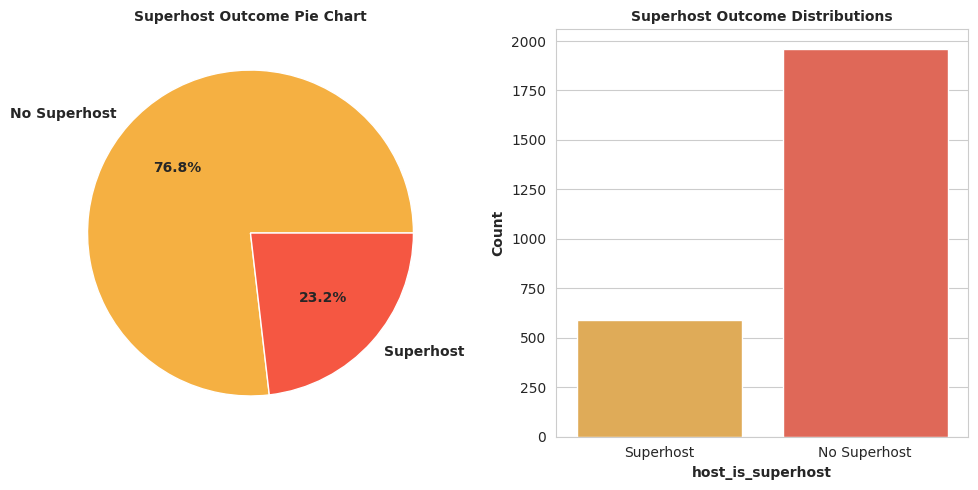

In [ ]:
fig = plt.figure(figsize = (10, 5))

plt.subplot(121)
plt.pie(y_train.value_counts(),
        labels = ['No Superhost', 'Superhost'],
        autopct = '%.1f%%',
        radius = 1,
        colors=["#f5b042", "#f55742"],
        textprops={'fontsize': 10, 'fontweight': 'bold'})
plt.title('Superhost Outcome Pie Chart', fontsize = 10, fontweight = 'bold')

plt.subplot(122)
resp = y_train.apply(lambda x: "No Superhost" if x == 0 else "Superhost")
t = sns.countplot(x=resp, palette=["#f5b042", "#f55742"])
t.set_xlabel('host_is_superhost', fontweight = 'bold', fontsize = 10)
t.set_ylabel('Count', fontweight = 'bold', fontsize = 10)

plt.title('Superhost Outcome Distributions', fontsize = 10, fontweight = 'bold')
plt.tight_layout()

### **SMOTE Method**

In [ ]:
# from imblearn.under_sampling import RandomUnderSampler
# from imblearn.over_sampling import RandomOverSampler, SMOTE

# print('Before OverSampling, the shape of X_train: {}'.format(X_train.shape))
# print('Before OverSampling, the shape of y_train: {} \n'.format(y_train.shape))

# print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) # Response
# print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) # No Response

# # Undersampling
# us = RandomUnderSampler(sampling_strategy = 'auto')
# X_balanced_res, y_balanced_res = us.fit_resample(X_train,y_train)

# # Oversampling
# # os = RandomOverSampler(sampling_strategy = 0.5)
# # X_balanced_res, y_balanced_res = os.fit_resample(X_train,y_train)

# # Oversampling SMOTE
# # sm = SMOTE(sampling_strategy=0.5, random_state = 2)
# # X_balanced_res, y_balanced_res = sm.fit_resample(X_train,y_train)

# print('After OverSampling, the shape of X_train: {}'.format(X_balanced_res.shape))
# print('After OverSampling, the shape of y_train: {} \n'.format(y_balanced_res.shape))

# print("After OverSampling, counts of label '1': {}".format(sum(y_balanced_res == 1)))
# print("After OverSampling, counts of label '0': {}".format(sum(y_balanced_res == 0)))

# X_train = X_balanced_res
# y_train = y_balanced_res

In [ ]:
print("Training shape:", X_train.shape, y_train.shape)
print("Testing shape:", X_test.shape, y_test.shape)

Training shape: (2552, 25) (2552,)
Testing shape: (639, 25) (639,)


# **====== STAGE 3 ======**
`Stage 3 (ML Modelling & Evaluation)`

Best Model:

Sources Parameter: https://www.geeksforgeeks.org/how-to-tune-hyperparameters-in-gradient-boosting-algorithm/

## **📌 Machine Learning Techniques**

Untuk memprediksi kelas adalah superhost atau tidak kita menggunakan binary classification untuk mendeteksinya berdasarkan beberapa fitur yang sudah kita gunakan

source: https://www.researchgate.net/profile/Vedant-Bahel/publication/347580959_A_Comparative_Study_on_Various_Binary_Classification_Algorithms_and_their_Improved_Variant_for_Optimal_Performance/links/60911b01299bf1ad8d7727a0/A-Comparative-Study-on-Various-Binary-Classification-Algorithms-and-their-Improved-Variant-for-Optimal-Performance.pdf


**Modelling** menggunakan percobaan model:
1. Decision Tree
2. Random Forest
3. Logistic Regression
4. Gaussian Naive Bayes
5. K-Nearest Neighbor
6. MLP Classifier (Neural Network)
7. Adaboost Classifier
8. XGBoost Classifier
9. LGBM Classifier
10. Gradient Boosting Classifier
11. Support Vector Machine

Apabila **overfitting** menggunakan metode:
1. cross-validation (2f, 4f, 5f and 10f)

**Hyperparameter tuning** yang digunakan:
1. Grid Search (Hasil menyebabkan overfitting)

**Model evaluasi** yang digunakan metrik:
1. Accuracy
2. Precision
3. Recall
4. F1-score



**Target Explanation**

> * `True Positive (TP)`, ketika seorang host yang sebenarnya adalah superhost diprediksi sebagai superhost.
> * `False Positive (FP)`, ketika seorang host yang sebenarnya bukan superhost tetapi diprediksi sebagai superhost.
> * `True Negative (TN)`, ketika seorang host yang sebenarnya bukan superhost diprediksi sebagai bukan superhost.
> * `False Negative (FN), ketika seorang host yang sebenarnya adalah superhost tetapi diprediksi sebagai bukan superhost.

> * `Positive / 1` = Host yang teridentifikasi sebagai superhost.
> * `Negative / 0`= Host yang teridentifikasi sebagai bukan superhost.

> * `False Negative` = Host yang teridentifikasi sebagai bukan superhost tetapi sebenarnya adalah superhost.
> * `False Positive` = Host yang teridentifikasi sebagai superhost tetapi sebenarnya bukan superhost.

**Parameter Evaluasi Model**

- `Precision` sebagai Parameter Evaluasi Utama

- Meningkatkan akurasi dalam mengidentifikasi superhost.  
- Mereduksi False Positif (Host yang diprediksi sebagai superhost, namun kenyataannya bukan).

- `Recall` sebagai Parameter Evaluasi Sekunder

- Mengoptimalkan jumlah superhost yang teridentifikasi.  
- Mereduksi False Negative (Host yang diprediksi bukan superhost, namun sebenarnya adalah superhost).

- `F1 Score` untuk memeriksa keseimbangan antara positif dan negatif (Data Tidak Seimbang). Sangat penting untuk masalah ini, kita membutuhkan trade-off antara Precision dan Recall, oleh karena itu, kami menggunakan skor F1 sebagai metrik. Skor F1 didefinisikan sebagai rata-rata harmonik dari Precision dan Recall.

**Interpretation**

- `Precision` – Berapa persen dari prediksi yang benar? :

Dari test data yang diprediksi positif (superhost), berarti x% yang sebenarnya adalah positif (superhost)

Dari data yang diprediksi sebagai superhost, berarti x% yang sebenarnya adalah superhost.

- `Recall` – Berapa persen dari kasus positif yang berhasil kita tangkap? :

Dari semua yang sebenarnya adalah positif (superhost), yang berhasil diprediksi sebagai superhost adalah x%.

**`Target Metrics` =  `Precision` / `Recall` & `F1 Score`**

- `Precision` adalah rasio prediksi benar positif dibandingkan dengan keseluruhan hasil yang diprediksi positif. Pilih algoritma yang memiliki `Precision` tinggi, jika skenario yang dipilih adalah `False Negative lebih baik terjadi daripada False Positif`.

$$  
\text{Precision} = \frac{TP}{TP + FP}  
$$

- `Recall` adalah rasio kasus dengan prediksi benar positif dibandingkan dengan keseluruhan data yang benar positif. Pilih algoritma yang memiliki `Recall` tinggi, jika skenario yang dipilih adalah `False Positive lebih baik terjadi daripada False Negative`.

$$  
\text{Recall} = \frac{TP}{TP + FN}  
$$

- `F1-Score` atau dikenal juga dengan nama F-Measure didapatkan dari perbandingan rata-rata presisi dengan recall yang dibobotkan.

$$  
\text{F1 Score} = \frac{2 \times (Recall \times Precision)}{Recall + Precision}  
$$

**Description Classification Report :**

Ini adalah metode Python di bawah API metrik sklearn, berguna ketika kita membutuhkan metrik per kelas di samping metrik global. Ini memberikan precision, recall, dan F1 score pada tingkat individu dan global.

* `precision`akan menjadi "berapa banyak yang diklasifikasikan dengan benar di antara kelas tersebut" (Persentase prediksi positif yang benar relatif terhadap total prediksi positif).

* `recall` berarti "berapa banyak dari kelas ini yang Anda temukan di seluruh jumlah elemen kelas ini". (Persentase prediksi positif yang benar relatif terhadap total aktual positif).

* `f1-score` adalah rata-rata harmonik antara precision & recall. Semakin dekat ke 1, semakin baik model.

* `support` adalah jumlah kemunculan kelas tertentu dalam dataset. Nilai-nilai ini memberi tahu kita berapa banyak host yang termasuk dalam setiap kelas dalam dataset uji. (untuk memeriksa dataset yang seimbang/Proporsi).

* `Accuracy` adalah jumlah dari true positives dan true negatives dibandingkan dengan total jumlah sampel.

* `Macro Average` adalah rata-rata dari precision/recall/F1-score dari semua kelas.

* `Weighted Average` menghitung skor untuk setiap kelas secara independen, tetapi ketika dijumlahkan, mempertimbangkan jumlah klasifikasi yang benar dari setiap kelas.

---

**Referensi Teori**

- https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html
- https://muthu.co/understanding-the-classification-report-in-sklearn/#:~:text=A%20Classification%20report%20is%20used,classification%20report%20as%20shown%20below.
- https://machinelearningmastery.com/fbeta-measure-for-machine-learning/
- https://rey1024.medium.com/mengenal-accuracy-precission-recall-dan-specificity-serta-yang-diprioritaskan-b79ff4d77de8
- https://www.statology.org/sklearn-classification-report/

## **📌 Modelling**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
import xgboost as xgb
import lightgbm as lgb

# Modelling

models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Logistic Regression": LogisticRegression(random_state=42),
    "Gaussian Naive Bayes": GaussianNB(),
    "K-Nearest Neighbor": KNeighborsClassifier(),
    "MLP Classifier": MLPClassifier(random_state=42, max_iter=1000),
    "Adaboost Classifier": AdaBoostClassifier(random_state=42),
    "Gradient Boosting Classifier": GradientBoostingClassifier(random_state=42),
    "XGBoost Classifier": xgb.XGBClassifier(random_state=42, use_label_encoder=False),
    "LGBM Classifier": lgb.LGBMClassifier(random_state=42),
    "Support Vector Machine": SVC(random_state=42)
}

results = {}

In [ ]:
param_grids = {
    # "Decision Tree": {
    #     "criterion": ["gini", "entropy"],
    #     "max_depth": [None, 10, 20, 30],
    #     "min_samples_split": [2, 5, 10],
    # },
    # "Random Forest": {
    #     "n_estimators": [50, 100, 200],
    #     "max_depth": [None, 10, 20],
    #     "min_samples_split": [2, 5, 10],
    # },
    # "Logistic Regression": {
    #     "C": [0.01, 0.1, 1, 10],
    #     "solver": ["liblinear", "lbfgs"],
    # },
    # "Gaussian Naive Bayes": {},  # No hyperparameters to tune
    # "K-Nearest Neighbor": {
    #     "n_neighbors": [3, 5, 7, 9],
    #     "weights": ["uniform", "distance"],
    #     "metric": ["euclidean", "manhattan"],
    # },
    # "MLP Classifier": {
    #     "hidden_layer_sizes": [(50,), (100,), (50, 50)],
    #     "activation": ["relu", "tanh"],
    #     "solver": ["adam", "sgd"],
    #     "alpha": [0.0001, 0.001],
    # },
    # "Adaboost Classifier": {
    #     "n_estimators": [50, 100, 200],
    #     "learning_rate": [0.01, 0.1, 1],
    # },
    # "XGBoost Classifier": {
    #     "n_estimators": [50, 100, 200],
    #     "learning_rate": [0.01, 0.1, 0.2],
    #     "max_depth": [3, 6, 10],
    # },
    # "LGBM Classifier": {
    #     "n_estimators": [50, 100, 200],
    #     "learning_rate": [0.01, 0.1, 0.2],
    #     "max_depth": [3, 6, 10],
    # },
    # "Gradient Boosting Classifier": {
    #       'n_estimators': [50, 100, 200],
    #       'learning_rate': [0.01, 0.1, 0.2],
    #       'max_depth': [3, 5, 7],
    # },
    # "Support Vector Machine": {
    #     "C": [0.1, 1, 10],
    #     "kernel": ["linear", "rbf", "poly"],
    #     "gamma": ["scale", "auto"],
    # },
}



Training Decision Tree...
Performing fold validation for Decision Tree without grid search...


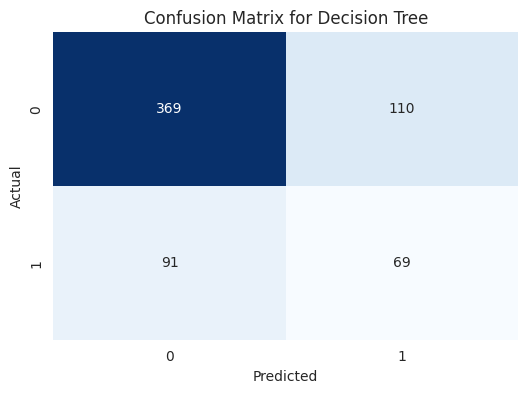


Training Random Forest...
Performing fold validation for Random Forest without grid search...


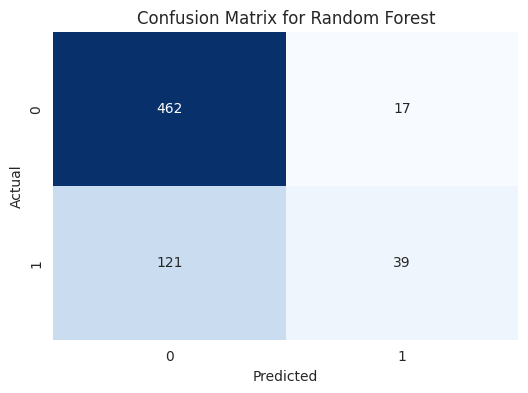


Training Logistic Regression...
Performing fold validation for Logistic Regression without grid search...


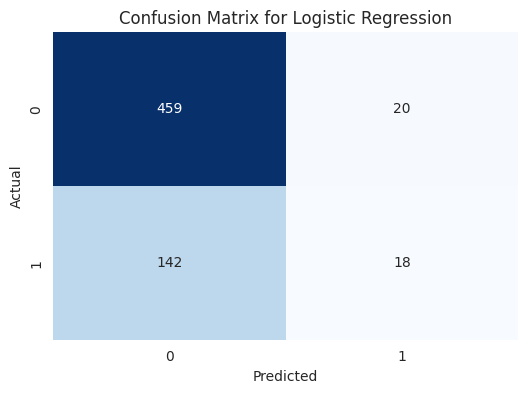


Training Gaussian Naive Bayes...
Performing fold validation for Gaussian Naive Bayes without grid search...


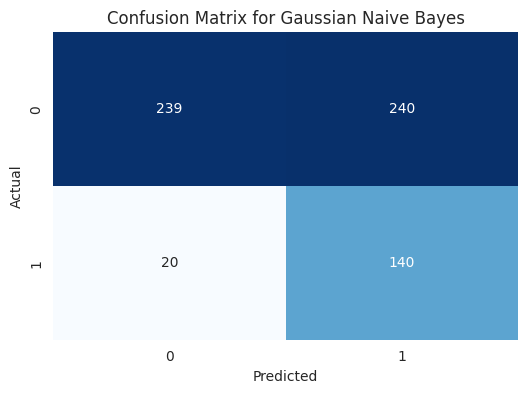


Training K-Nearest Neighbor...
Performing fold validation for K-Nearest Neighbor without grid search...


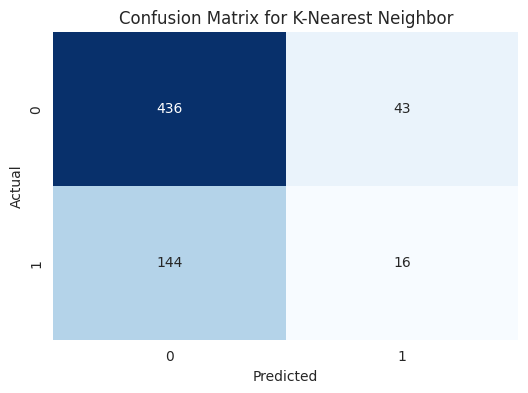


Training MLP Classifier...
Performing fold validation for MLP Classifier without grid search...


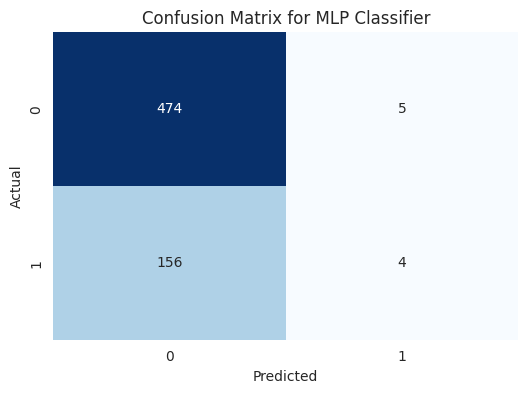


Training Adaboost Classifier...
Performing fold validation for Adaboost Classifier without grid search...


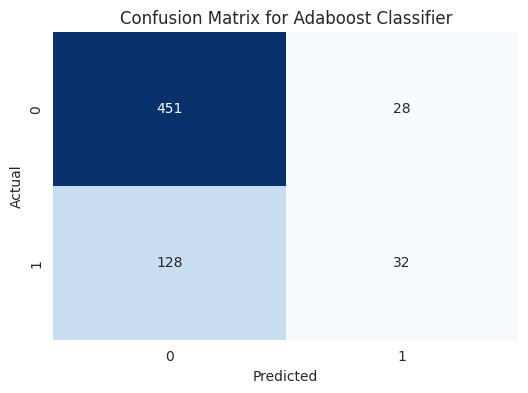


Training Gradient Boosting Classifier...
Performing fold validation for Gradient Boosting Classifier without grid search...


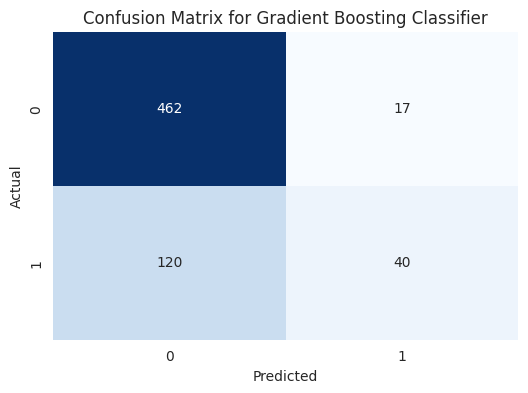


Training XGBoost Classifier...
Performing fold validation for XGBoost Classifier without grid search...


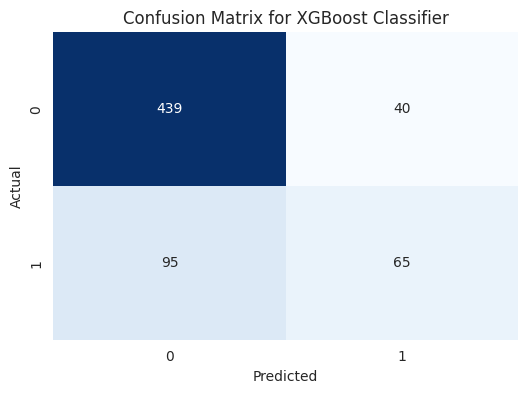


Training LGBM Classifier...
Performing fold validation for LGBM Classifier without grid search...
[LightGBM] [Info] Number of positive: 531, number of negative: 1765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1846
[LightGBM] [Info] Number of data points in the train set: 2296, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.231272 -> initscore=-1.201144
[LightGBM] [Info] Start training from score -1.201144
[LightGBM] [Info] Number of positive: 532, number of negative: 1764
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 2296, number of used feat

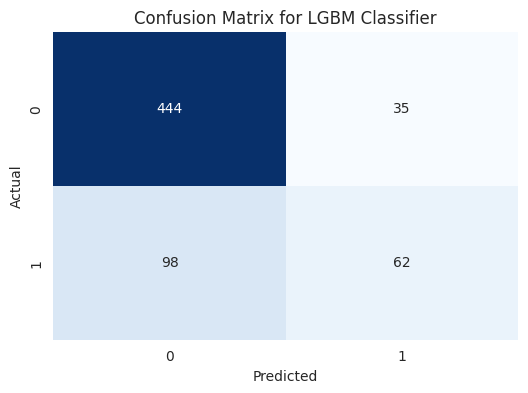


Training Support Vector Machine...
Performing fold validation for Support Vector Machine without grid search...


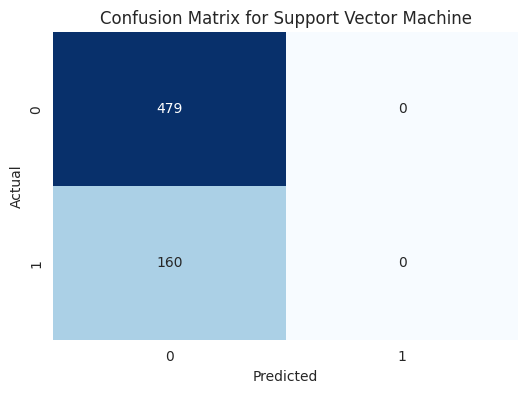

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
import time
import pickle


def model_training(X_train, X_test, y_train, y_test, models, param_grids=None, fold_validation=True, cv_folds=5, saved_models=True):
    results = {}

    for name, model in models.items():
        print(f"\nTraining {name}...")
        start_time = time.time()

        if param_grids and name in param_grids and fold_validation:
            print(f"Performing GridSearchCV for {name} with fold validation...")
            grid_search = GridSearchCV(
                model, param_grids[name], cv=StratifiedKFold(n_splits=cv_folds),
                scoring="accuracy", n_jobs=-1
            )
            grid_search.fit(X_train, y_train)
            best_model = grid_search.best_estimator_
            best_params = grid_search.best_params_
            model_to_evaluate = best_model
        else:
            if fold_validation:
                print(f"Performing fold validation for {name} without grid search...")
                skf = StratifiedKFold(n_splits=cv_folds)
                train_acc_list, test_acc_list = [], []

                for train_index, val_index in skf.split(X_train, y_train):
                    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
                    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

                    model.fit(X_train_fold, y_train_fold)
                    train_acc_list.append(accuracy_score(y_train_fold, model.predict(X_train_fold)))
                    test_acc_list.append(accuracy_score(y_val_fold, model.predict(X_val_fold)))

                train_acc = sum(train_acc_list) / len(train_acc_list)
                test_acc = sum(test_acc_list) / len(test_acc_list)
                model.fit(X_train, y_train)
                model_to_evaluate = model
            else:
                print(f"Training {name} without grid search or fold validation...")
                model.fit(X_train, y_train)
                model_to_evaluate = model

        # Evaluate the model
        y_train_pred = model_to_evaluate.predict(X_train)
        y_test_pred = model_to_evaluate.predict(X_test)

        train_acc = accuracy_score(y_train, y_train_pred)
        test_acc = accuracy_score(y_test, y_test_pred)
        train_precision = precision_score(y_train, y_train_pred, average='weighted')
        test_precision = precision_score(y_test, y_test_pred, average='weighted')
        train_recall = recall_score(y_train, y_train_pred, average='weighted')
        test_recall = recall_score(y_test, y_test_pred, average='weighted')
        train_f1 = f1_score(y_train, y_train_pred, average='weighted')
        test_f1 = f1_score(y_test, y_test_pred, average='weighted')

        # Calculate confusion matrix
        cm = confusion_matrix(y_test, y_test_pred)

        training_time = time.time() - start_time

        results[name] = {
            "train_accuracy": train_acc,
            "test_accuracy": test_acc,
            "train_precision": train_precision,
            "test_precision": test_precision,
            "train_recall": train_recall,
            "test_recall": test_recall,
            "train_f1": train_f1,
            "test_f1": test_f1,
            "training_time": training_time,
            "classification_report": classification_report(y_test, y_test_pred, output_dict=True),
            "confusion_matrix": cm,
            "model": model_to_evaluate
        }

        # Plot confusion matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=model_to_evaluate.classes_, yticklabels=model_to_evaluate.classes_)
        plt.title(f"Confusion Matrix for {name}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

        # if saved_models:
        #     filename = f'/content/drive/MyDrive/Models/{name}.sav'
        #     pickle.dump(model_to_evaluate, open(filename, 'wb'))

    return results

# Example usage
results = model_training(
    X_train, X_test, y_train, y_test,
    models=models,
    # param_grids=param_grids,  # Optional
    fold_validation=True,     # Set to False to disable fold validation
    cv_folds=10,              # Number of folds for cross-validation
    saved_models=True         # Set to False to disable saving models
)

#### **Model Evaluation**

In [ ]:
# Print results
for name, res in results.items():
    print(f"\nModel: {name}")
    if "best_params" in res:
        print(f"Best Parameters: {res['best_params']}")
    print(f"Train Accuracy: {res['train_accuracy']:.4f}")
    print(f"Test Accuracy: {res['test_accuracy']:.4f}")
    print(f"Train Precision: {res['train_precision']:.4f}")
    print(f"Test Precision: {res['test_precision']:.4f}")
    print(f"Train Recall: {res['train_recall']:.4f}")
    print(f"Test Recall: {res['test_recall']:.4f}")
    print(f"Train F1 Score: {res['train_f1']:.4f}")
    print(f"Test F1 Score: {res['test_f1']:.4f}")
    print(f"Training Time: {res['training_time']:.2f} seconds")
    print("Classification Report:")
    print(classification_report(y_test, res["model"].predict(X_test)))
    print("Confusion Matrix:")
    print(res["confusion_matrix"])
    print("=" * 60)


Model: Decision Tree
Train Accuracy: 1.0000
Test Accuracy: 0.6854
Train Precision: 1.0000
Test Precision: 0.6978
Train Recall: 1.0000
Test Recall: 0.6854
Train F1 Score: 1.0000
Test F1 Score: 0.6911
Training Time: 0.44 seconds
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.77      0.79       479
           1       0.39      0.43      0.41       160

    accuracy                           0.69       639
   macro avg       0.59      0.60      0.60       639
weighted avg       0.70      0.69      0.69       639

Confusion Matrix:
[[369 110]
 [ 91  69]]

Model: Random Forest
Train Accuracy: 1.0000
Test Accuracy: 0.7840
Train Precision: 1.0000
Test Precision: 0.7684
Train Recall: 1.0000
Test Recall: 0.7840
Train F1 Score: 1.0000
Test F1 Score: 0.7426
Training Time: 9.18 seconds
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.96      0.87       479
           1       0.

#### **Performance of Training Model**

In [ ]:
import pandas as pd

# Create a DataFrame to store the results
output_data = []

for name, res in results.items():
    row = {
        "Model": name,
        "Train Accuracy": res["train_accuracy"],
        "Test Accuracy": res["test_accuracy"],
        "Train Precision": res["train_precision"],
        "Test Precision": res["test_precision"],
        "Train Recall": res["train_recall"],
        "Test Recall": res["test_recall"],
        "Train F1 Score": res["train_f1"],
        "Test F1 Score": res["test_f1"],
        # "Training Time": res["training_time"]
    }
    output_data.append(row)

# Convert the list of dictionaries to a DataFrame
output_df = pd.DataFrame(output_data)

# Set the Model column as the index
output_df.set_index("Model", inplace=True)

# Function to apply color gradient (dark blue to light blue)
def color_gradient(val):
    normalized_val = val / output_df.max().max()
    color = f"background-color: rgba(173, 216, 230, {normalized_val}); color: black"
    return color

# Apply the color gradient to the DataFrame
styled_df = (
    output_df.style
    .applymap(color_gradient)  # Apply color gradient
    .format("{:.2f}")  # Format all values to 2 decimal places
)


# Display the styled DataFrame
display(styled_df)

,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score
Model,,,,,,,,
Decision Tree,1.00,0.69,1.00,0.70,1.00,0.69,1.00,0.69
Random Forest,1.00,0.78,1.00,0.77,1.00,0.78,1.00,0.74
Logistic Regression,0.76,0.75,0.70,0.69,0.76,0.75,0.70,0.68
Gaussian Naive Bayes,0.57,0.59,0.80,0.78,0.57,0.59,0.60,0.62
K-Nearest Neighbor,0.81,0.71,0.79,0.63,0.81,0.71,0.78,0.65
MLP Classifier,0.77,0.75,0.75,0.68,0.77,0.75,0.68,0.65
Adaboost Classifier,0.78,0.76,0.75,0.72,0.78,0.76,0.75,0.71
Gradient Boosting Classifier,0.85,0.79,0.85,0.77,0.85,0.79,0.82,0.75
XGBoost Classifier,1.00,0.79,1.00,0.77,1.00,0.79,1.00,0.77


### **Comparison Time Training**

In [ ]:
import pandas as pd

comparison_data = []

for name, res in results.items():
    row = {
        "Model": name,
        "Train Accuracy": res["train_accuracy"],
        "Test Accuracy": res["test_accuracy"],
        "Training Time": res["training_time"],
        "Precision (Train)": res["classification_report"]["weighted avg"]["precision"],
        "Recall (Train)": res["classification_report"]["weighted avg"]["recall"],
        "F1 Score (Train)": res["classification_report"]["weighted avg"]["f1-score"],
        "Precision (Test)": res["classification_report"]["weighted avg"]["precision"],
        "Recall (Test)": res["classification_report"]["weighted avg"]["recall"],
        "F1 Score (Test)": res["classification_report"]["weighted avg"]["f1-score"]
    }
    comparison_data.append(row)

# Create DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Set the Model column as the index
comparison_df.set_index("Model", inplace=True)

# Display the DataFrame
print(comparison_df)

                              Train Accuracy  Test Accuracy  Training Time  \
Model                                                                        
Decision Tree                       1.000000       0.685446       0.441357   
Random Forest                       1.000000       0.784038       9.176657   
Logistic Regression                 0.763323       0.746479       0.703868   
Gaussian Naive Bayes                0.574060       0.593114       0.145659   
K-Nearest Neighbor                  0.806818       0.707355       2.139244   
MLP Classifier                      0.772335       0.748044      11.562878   
Adaboost Classifier                 0.783307       0.755869       3.529257   
Gradient Boosting Classifier        0.846395       0.785603      12.213844   
XGBoost Classifier                  1.000000       0.788732       2.558615   
LGBM Classifier                     0.994906       0.791862       2.033440   
Support Vector Machine              0.768417       0.749609     

### **Feature Importance**

Feature Importance for Model: Decision Tree


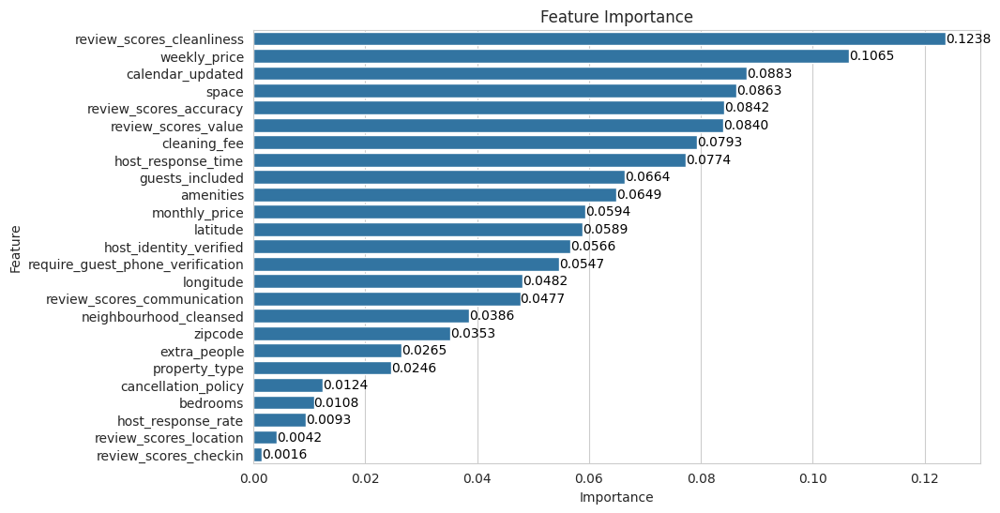

Feature Importance for Model: Random Forest


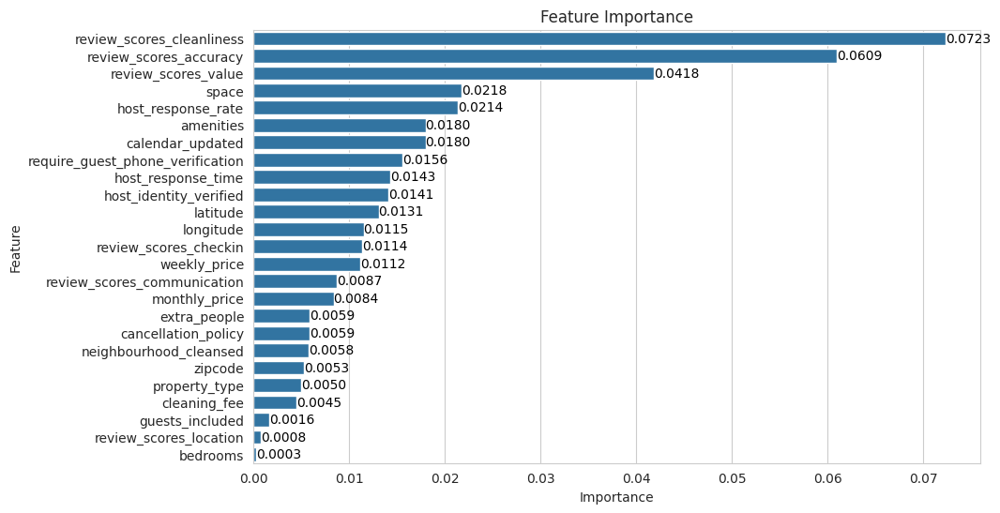

Feature Importance for Model: Logistic Regression


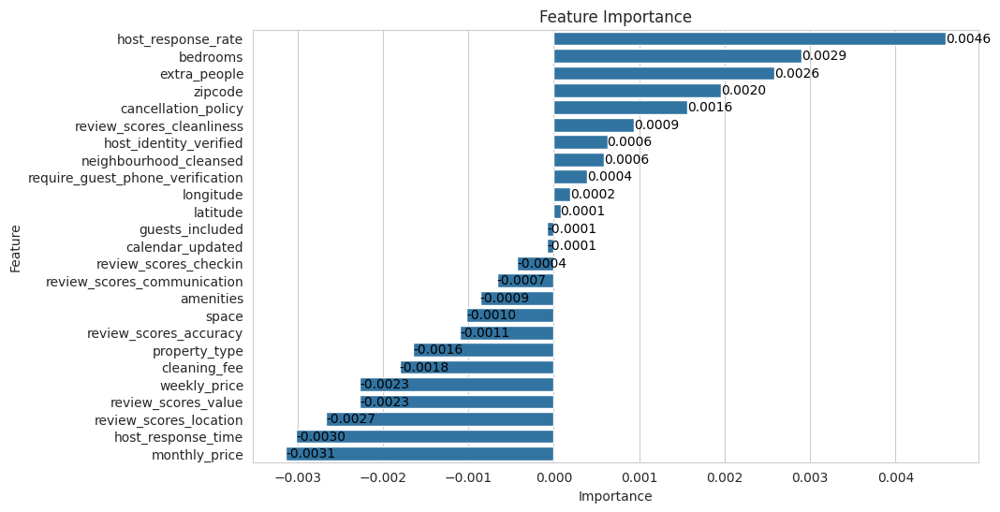

Feature Importance for Model: Gaussian Naive Bayes


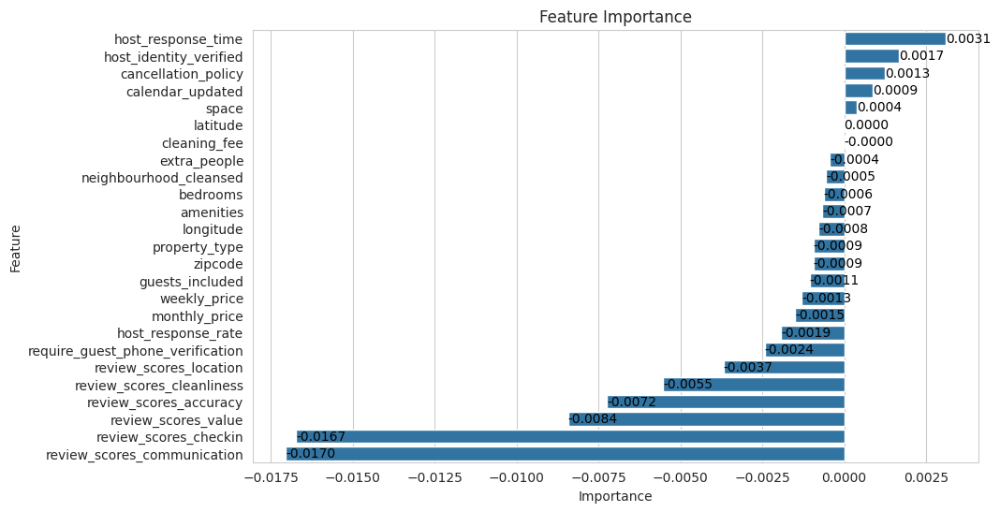

Feature Importance for Model: K-Nearest Neighbor


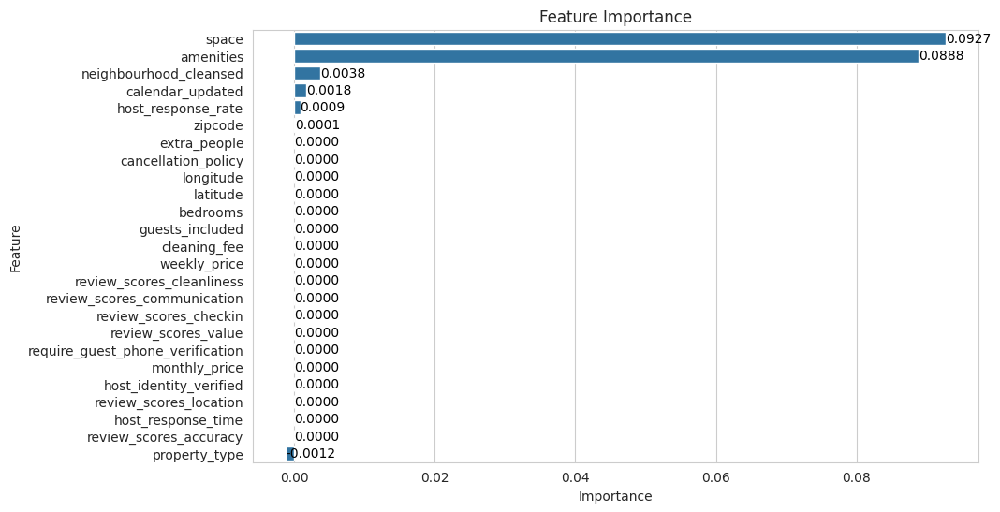

Feature Importance for Model: MLP Classifier


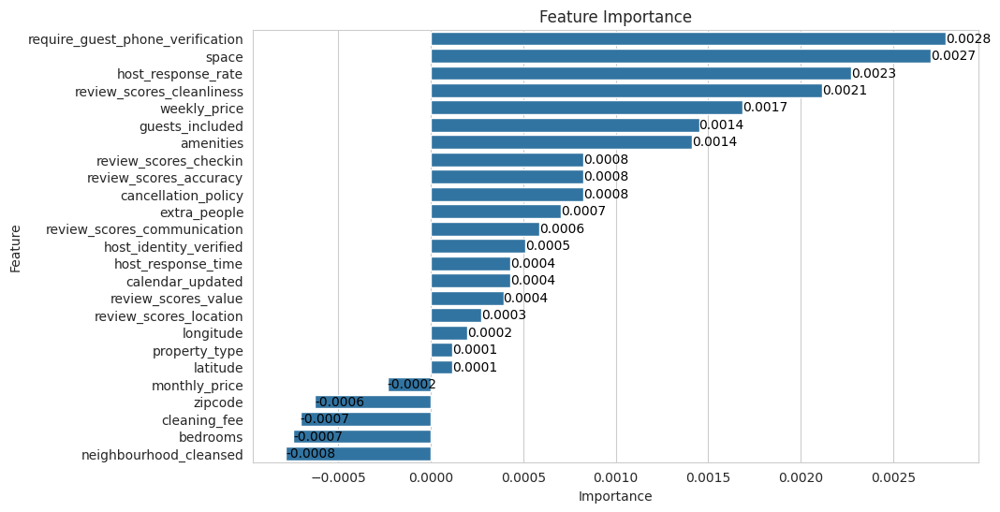

Feature Importance for Model: Adaboost Classifier


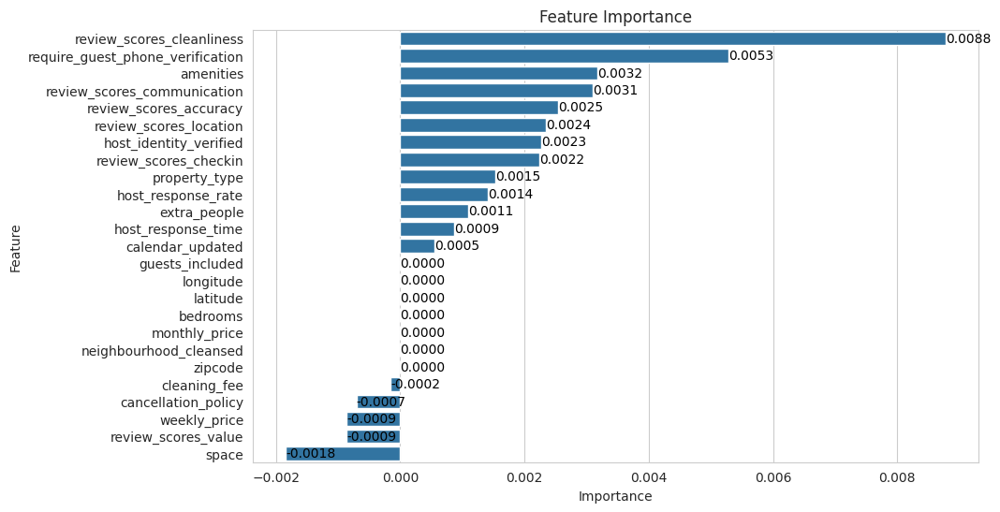

Feature Importance for Model: Gradient Boosting Classifier


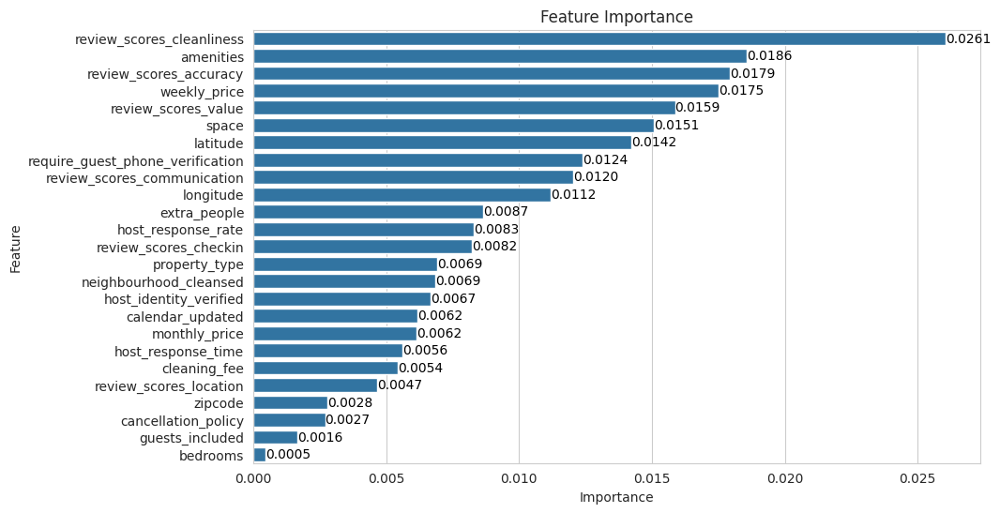

Feature Importance for Model: XGBoost Classifier


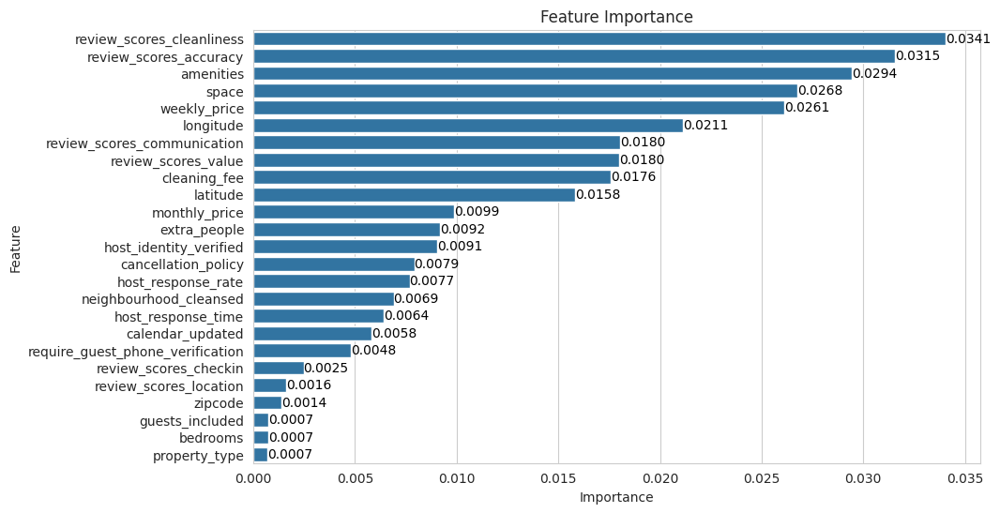

Feature Importance for Model: LGBM Classifier


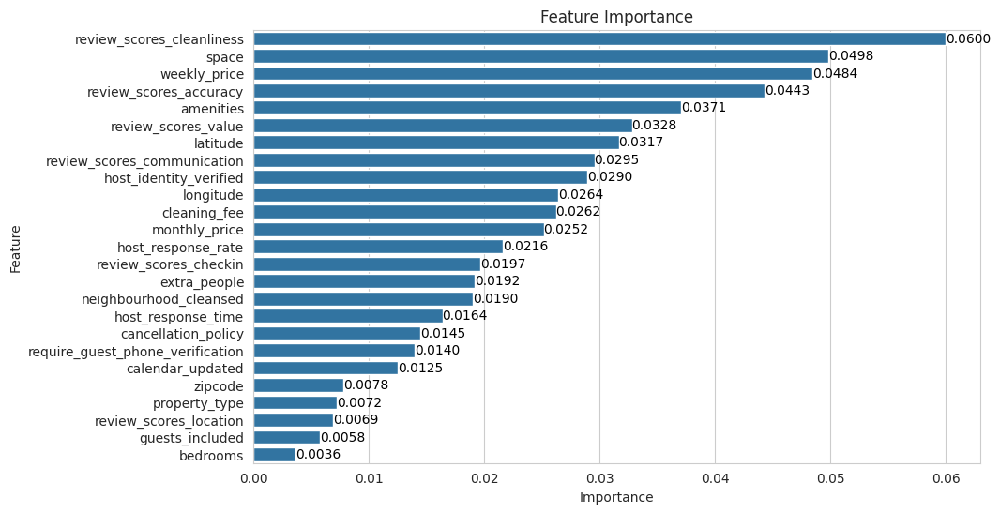

Feature Importance for Model: Support Vector Machine


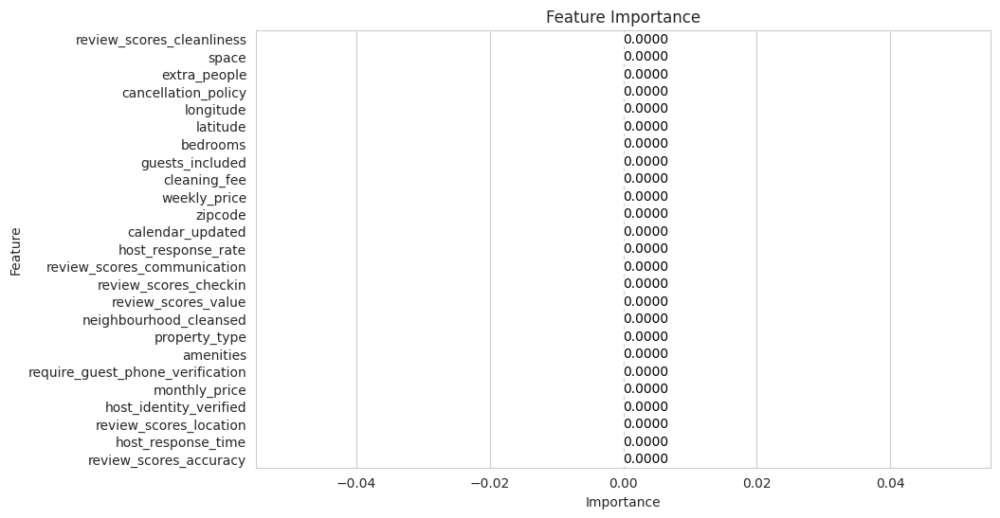

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.inspection import permutation_importance

def plot_feature_importance(model, X_train, y_train):
    # Calculate permutation importance
    result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

    # Create a DataFrame
    importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': result.importances_mean
    })
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    # Plotting
    plt.figure(figsize=(10, 6))
    bar_plot = sns.barplot(x='Importance', y='Feature', data=importance_df)
    plt.title('Feature Importance')

    # Adding the importance values on top of the bars
    for index, value in enumerate(importance_df['Importance']):
        bar_plot.text(value, index, f'{value:.4f}', color='black', ha="left", va="center")

    plt.show()

# Assuming results is a dictionary containing models
for name, res in results.items():
    print(f"Feature Importance for Model: {name}")
    plot_feature_importance(res['model'], X_train, y_train)


## **📌 Model Selection**

**Model: Gradient Boosting Classifier**

* Train Accuracy: 0.8464
* Test Accuracy: 0.7856
* Train Precision: 0.8497
* Test Precision: 0.7708
* Train Recall: 0.8464
* Test Recall: 0.7856
* Train F1 Score: 0.8235
* Test F1 Score: 0.7451
* Training Time: 12.21 seconds

precision    recall  f1-score   support

           0       0.79      0.96      0.87       479
           1       0.70      0.25      0.37       160

    accuracy                           0.79       639
   macro avg       0.75      0.61      0.62       639
weighted avg       0.77      0.79      0.75       639

Confusion Matrix:
[[462  17]
 [120  40]]

### **Summary**

Berdasarkan hasil temuan dengan menggunakan berbagai macam model, ditemukan model terbaik yaitu :

**`Gradient Boosting Classifier`**

dengan method sebagai berikut :

* `Default Parameter (No Tuning)`
Dengan parameter terbaik menggunakan Grid Search hasilnya menjadi overfitting pada modelnya.
* `Without SMOTE`
Menambah 2% akurasi Test

* `25 Feature, 1 Target`
* `Label Encoder`
Untuk fitur Categorical

* `Yeo-Johnson Transformation`
Menambah 2% akurasi Gradient Boosting Classifier
Menambah 0-2% akurasi model lainnya.

* `Robust Scaler`



## **📌 Business Insight and Recommendation**

**📌Conclusion**

Berdasarkan modelling machine learning menggunakan metode `Graidient Boosting Clasiffier` dengan hasil sebagai berikut :

    - Precision = 0.77
    - Recall = 0.79
    - F1 Score = 0.75
    - Training Time : 12.21 seconds

Didapatkan Top feature yang paling berpengaruh untuk memprediksi model terhadap target/label `host_is_superhost` diantaranya adalah:

   1. review_scores_cleanliness
Skor kebersihan properti
   2. Amenities
Fasilitas yang lengkap dan berkualitas
   3. review_scores_accuracy
Skor akurasi deskripsi listing
   4. weekly_price
Harga sewa mingguan  
   5. review_score_value
Skor nilai dari ulasan
   6. space
Deskripsi tentang ruang akomodasi
   7. require_guest_phone_verification
Verifikasi telepon tamu

## **📌 Business Insight and Recommendation**

**📌Conclusion**

## 📌Strategic Action
1. **Rekomendasi : Fokus pada Peningkatan Kualitas Properti & Pengalaman Tamu**
* Insight : Kebersihan dan fasilitas yang lengkap memiliki dampak signifikan terhadap skor dan prediksi status Superhost. Meskipun banyak properti memiliki skor kebersihan yang baik, masih ada peluang untuk meningkatkan pengalaman tamu melalui fasilitas dan akurasi deskripsi.

* Actionable Items :
  1. Implement Regular Cleaning Audits: Lakukan audit kebersihan secara berkala untuk memastikan standar tinggi dan meningkatkan skor kebersihan.
  2. Upgrade Amenities: Investasikan dalam fasilitas tambahan yang populer, seperti Wi-Fi cepat dan peralatan dapur modern, untuk meningkatkan daya tarik properti.
  3. Enhance Listing Accuracy: Tinjau dan perbarui deskripsi listing secara berkala untuk memastikan akurasi dan menarik perhatian calon tamu.


2. **Rekomendasi : Manfaatkan Guest Feedback untuk Peningkatan berkelanjutan**

* Insight : Ulasan tamu yang positif berkontribusi pada skor keseluruhan dan dapat meningkatkan konversi menjadi Superhost. Namun, banyak properti tidak memanfaatkan umpan balik untuk perbaikan.

* Actionable Items :
  1. Establish a Feedback Loop: Kumpulkan dan analisis umpan balik tamu secara rutin untuk mengidentifikasi area perbaikan.
  2. Respond to Reviews: Tanggapi semua ulasan, baik positif maupun negatif, untuk menunjukkan perhatian terhadap pengalaman tamu.
  3. Incorporate Guest Suggestions: Implementasikan saran dari tamu untuk meningkatkan fasilitas dan layanan.

3. **Rekomendasi : Optimalkan Guest Verification & Communication**

* insight : Proses verifikasi tamu dan komunikasi yang efektif dapat meningkatkan kepercayaan dan kepuasan tamu, yang berkontribusi pada status Superhost.

* Actionable Items:
  1. Enhance Guest Verification Process: Terapkan sistem verifikasi telepon dan identitas yang lebih ketat untuk meningkatkan keamanan.
  2. Improve Communication Channels: Gunakan platform komunikasi yang efisien untuk menjawab pertanyaan tamu dengan cepat dan jelas.
  3. Provide Pre-Arrival Information: Kirimkan informasi penting sebelum kedatangan tamu untuk mempersiapkan mereka dan meningkatkan pengalaman menginap.

###Distribusi Nilai Kebersihan Ulasan Berdasarkan Status Superhost

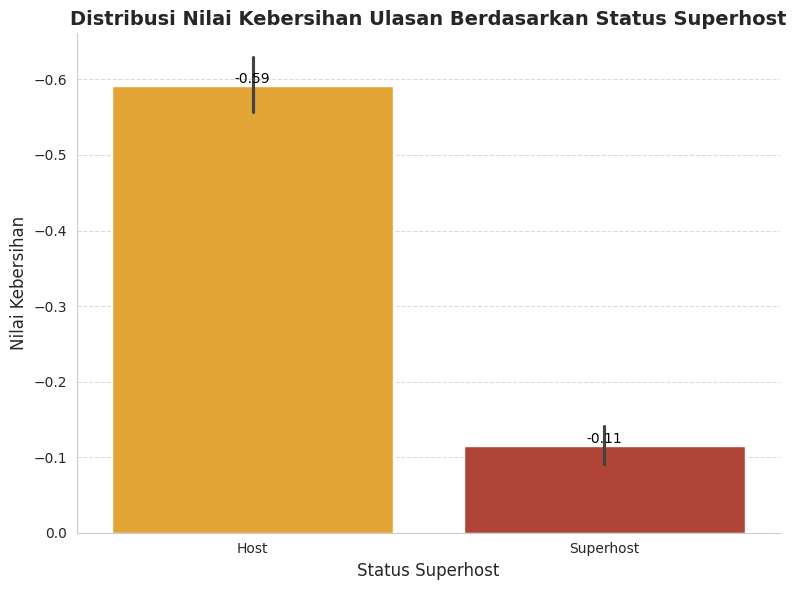

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='review_scores_cleanliness',
    data=df,
    palette=custom_palette
)

plt.title('Distribusi Nilai Kebersihan Ulasan Berdasarkan Status Superhost', fontsize=14, fontweight='bold')
plt.xlabel('Status Superhost', fontsize=12)
plt.ylabel('Nilai Kebersihan', fontsize=12)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=10)

plt.gca().invert_yaxis()

plt.grid(axis='y', linestyle='--', alpha=0.7)

sns.despine()

for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()


Diagram ini menunjukkan bahwa properti dengan status Superhost memiliki nilai rata-rata kebersihan ulasan yang lebih tinggi (lebih dekat ke 0) dibandingkan dengan properti yang bukan Superhost. Ini mengindikasikan bahwa tamu cenderung memberikan ulasan yang lebih baik tentang kebersihan properti Superhost dibandingkan dengan properti yang bukan Superhost.

###Distribusi Fasilitas yang Lengkap dan Berkualitas Status Superhost

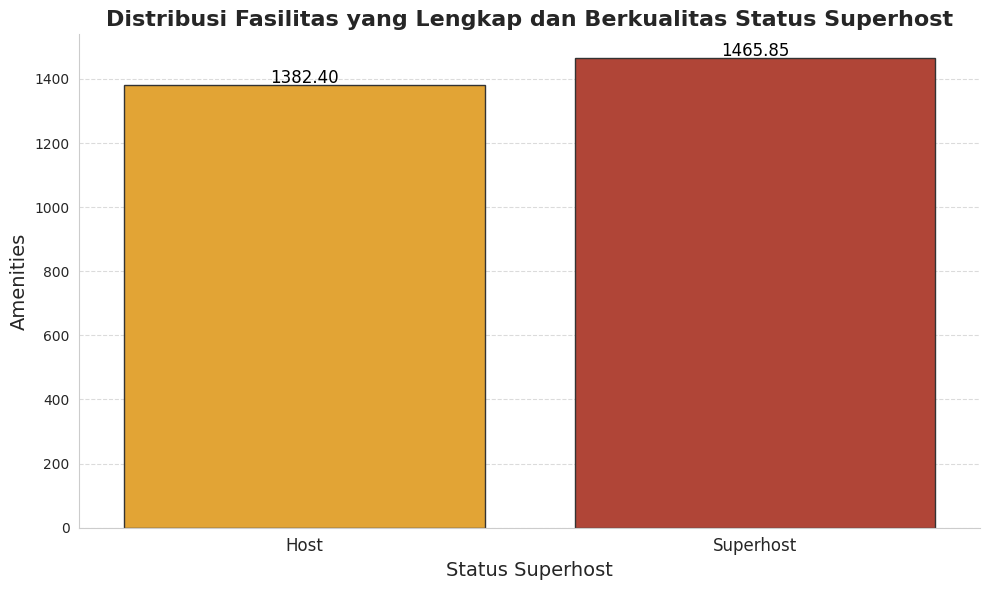

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    x='host_is_superhost',
    y='amenities',
    data=df,
    palette=["#ffac18", "#c43623"],
    ci=None,
    edgecolor=".2"
)

plt.title(
    'Distribusi Fasilitas yang Lengkap dan Berkualitas Status Superhost',
    fontsize=16,
    fontweight='bold'
)
plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Amenities', fontsize=14)
plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost cenderung memiliki fasilitas yang lebih lengkap dan berkualitas dibandingkan dengan properti yang bukan Superhost. Perbedaan nilai antara keduanya (1465.85 vs 1382.40) mengindikasikan bahwa Superhost mungkin menawarkan lebih banyak fasilitas atau fasilitas yang lebih baik kepada tamu mereka.

###Distribusi Skor Akurasi Deskripsi Listing Berdasarkan Status Superhost

<Figure size 1000x600 with 0 Axes>

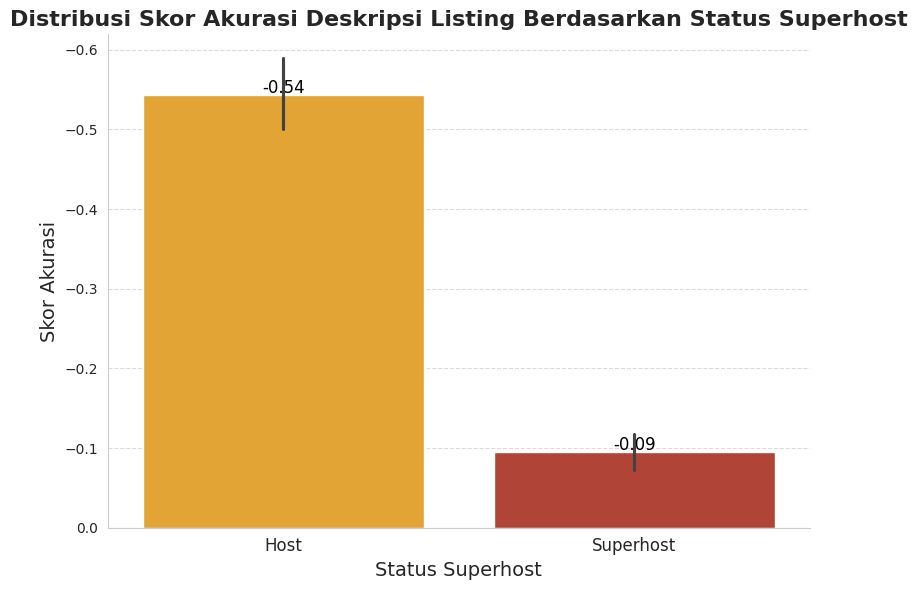

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='review_scores_accuracy',
    data=df,
    palette=custom_palette
)

plt.title(
    'Distribusi Skor Akurasi Deskripsi Listing Berdasarkan Status Superhost',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Skor Akurasi', fontsize=14)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost memiliki skor akurasi deskripsi listing yang lebih tinggi (lebih dekat ke 0) dibandingkan dengan properti yang bukan Superhost. Ini mengindikasikan bahwa deskripsi listing properti Superhost cenderung lebih akurat dan sesuai dengan kondisi aktual properti.

###Distribusi Weekly Price Berdasarkan Status Superhost

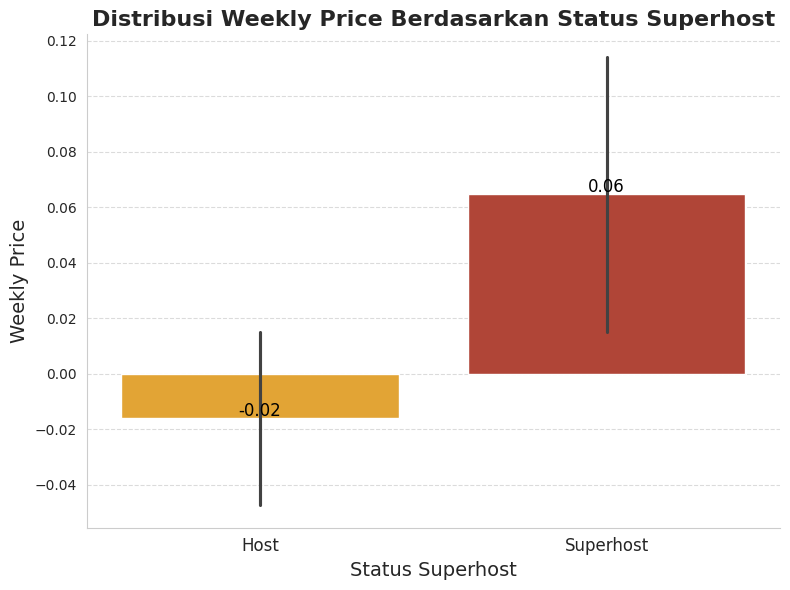

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='weekly_price',
    data=df,
    palette=custom_palette
)


plt.title(
    'Distribusi Weekly Price Berdasarkan Status Superhost',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Weekly Price', fontsize=14)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost memiliki harga mingguan yang lebih tinggi (0.06) dibandingkan dengan properti yang bukan Superhost (-0.02). Ini mengindikasikan bahwa properti Superhost cenderung mengenakan biaya lebih untuk sewa mingguan mereka.

###Distribusi Skor Nilai dari Ulasan Berdasarkan Status Superhost

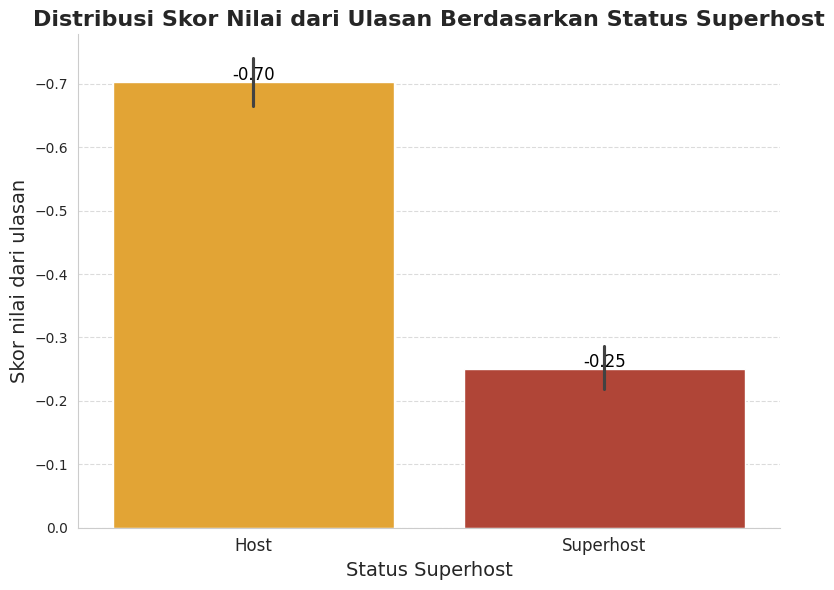

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='review_scores_value',
    data=df,
    palette=custom_palette
)


plt.title(
    'Distribusi Skor Nilai dari Ulasan Berdasarkan Status Superhost',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Skor nilai dari ulasan', fontsize=14)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost memiliki skor nilai rata-rata ulasan yang lebih tinggi (lebih dekat ke 0) dibandingkan dengan properti yang bukan Superhost. Ini mengindikasikan bahwa tamu cenderung memberikan nilai yang lebih baik pada properti Superhost dibandingkan dengan properti yang bukan Superhost.

###Distribusi Ruang Akomodasi Berdasarkan Status Superhost

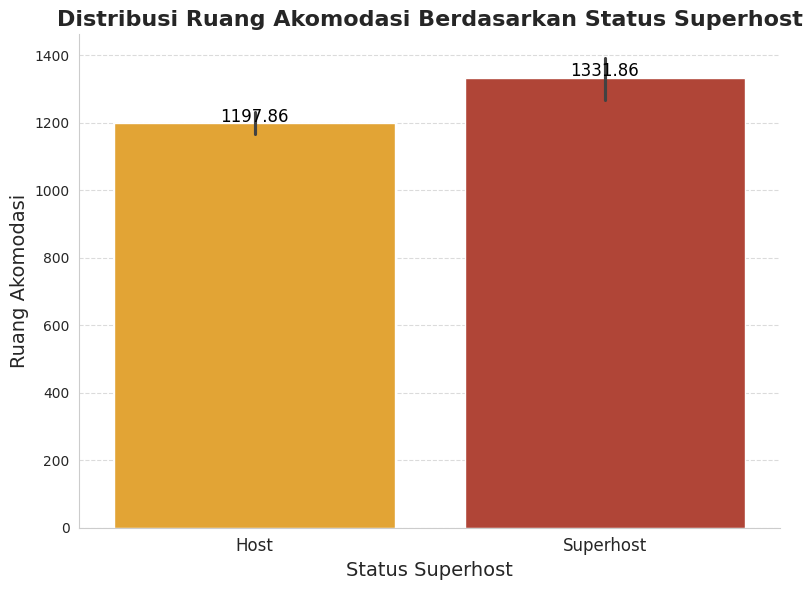

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='space',
    data=df,
    palette=custom_palette
)


plt.title(
    'Distribusi Ruang Akomodasi Berdasarkan Status Superhost',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Ruang Akomodasi', fontsize=14)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)


plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost cenderung memiliki ruang akomodasi yang lebih besar atau lebih banyak dibandingkan dengan properti yang bukan Superhost. Perbedaan nilai antara keduanya (1331.86 vs 1197.86) mengindikasikan bahwa Superhost mungkin menawarkan lebih banyak kamar, properti yang lebih luas, atau kapasitas hunian yang lebih besar kepada tamu mereka.

###Distribusi Verifikasi Telepon Tamu Berdasarkan Status Superhost

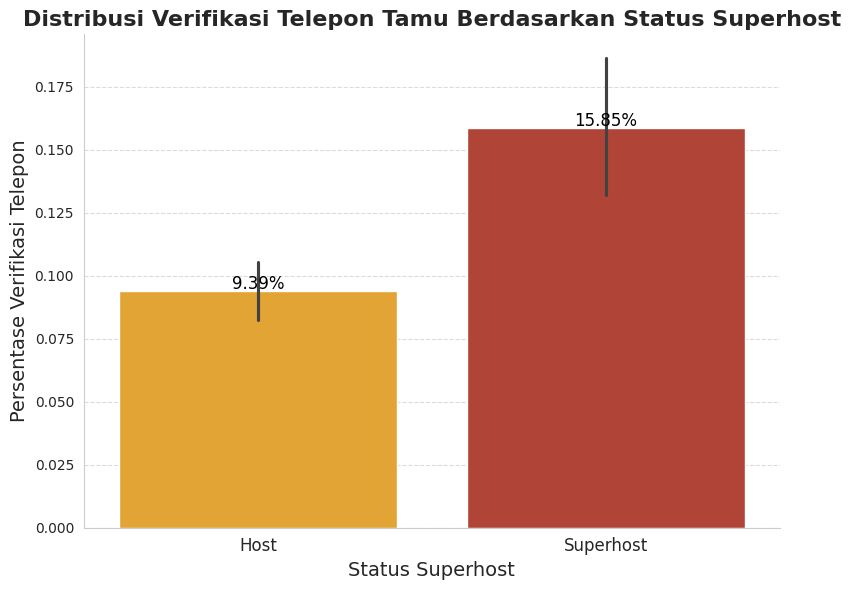

In [ ]:
sns.set_style("whitegrid")

plt.figure(figsize=(8, 6))

colors = ["#ffac18", "#c43623"]

custom_palette = sns.color_palette(colors)

ax = sns.barplot(
    x='host_is_superhost',
    y='require_guest_phone_verification',
    data=df,
    palette=custom_palette
)


plt.title(
    'Distribusi Verifikasi Telepon Tamu Berdasarkan Status Superhost',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Status Superhost', fontsize=14)
plt.ylabel('Persentase Verifikasi Telepon', fontsize=14)

plt.xticks([0, 1], ['Host', 'Superhost'], fontsize=12)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:.2%}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='center',
        fontsize=12,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

sns.despine()

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Diagram ini menunjukkan bahwa properti dengan status Superhost memiliki tingkat verifikasi telepon tamu yang lebih tinggi (15.85%) dibandingkan dengan properti yang bukan Superhost (9.39%). Ini mengindikasikan bahwa Superhost mungkin lebih aktif dalam memverifikasi nomor telepon tamu mereka, atau platform tempat mereka berinteraksi mungkin memiliki fitur verifikasi yang lebih baik atau lebih ditekankan.

# **====== STAGE 4 ======**
`Stage 4 (Final Presentation)`